In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
df1 = pd.read_csv('application_data.csv')
df1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [5]:
df1.shape

(307511, 122)

In [6]:
df1.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [7]:
df2 = pd.read_csv('previous_application.csv')
df2.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df2.shape

(1670214, 37)

In [9]:
df2.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [10]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
SK_ID_PREV                     1670214 non-null int64
SK_ID_CURR                     1670214 non-null int64
NAME_CONTRACT_TYPE             1670214 non-null object
AMT_ANNUITY                    1297979 non-null float64
AMT_APPLICATION                1670214 non-null float64
AMT_CREDIT                     1670213 non-null float64
AMT_DOWN_PAYMENT               774370 non-null float64
AMT_GOODS_PRICE                1284699 non-null float64
WEEKDAY_APPR_PROCESS_START     1670214 non-null object
HOUR_APPR_PROCESS_START        1670214 non-null int64
FLAG_LAST_APPL_PER_CONTRACT    1670214 non-null object
NFLAG_LAST_APPL_IN_DAY         1670214 non-null int64
RATE_DOWN_PAYMENT              774370 non-null float64
RATE_INTEREST_PRIMARY          5951 non-null float64
RATE_INTEREST_PRIVILEGED       5951 non-null float64
NAME_CASH_LOAN_PURPOSE         1670214 non-null object
NAME_CONTRA

## Working on Applications Dataset

In [11]:
### assigning a new dataset.

application = pd.DataFrame(df1)
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
## printing the column names
for col in application.columns:
    print(col) 

SK_ID_CURR
TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
OCCUPATION_TYPE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
APARTMENTS_AVG
BASEMENTAREA_AVG
YEARS_BEGINEXPLUATATION_AVG
YEARS_BUILD_AVG
COMMONAREA_AVG
ELEVATORS_AVG
ENTRANCES_AVG
FLOORSMAX_AVG
FLOORSMIN_AVG
LANDAREA_AVG
LIVINGAPARTMENTS_AVG
LIVINGAREA_AVG
NONLIVINGAPARTMENTS_AVG
NONLIVINGAREA_AVG
APART

In [13]:
## calculating the total null percentage
(application.isnull().sum()*100/len(application)).round(2)

SK_ID_CURR                     0.00
TARGET                         0.00
NAME_CONTRACT_TYPE             0.00
CODE_GENDER                    0.00
FLAG_OWN_CAR                   0.00
FLAG_OWN_REALTY                0.00
CNT_CHILDREN                   0.00
AMT_INCOME_TOTAL               0.00
AMT_CREDIT                     0.00
AMT_ANNUITY                    0.00
AMT_GOODS_PRICE                0.09
NAME_TYPE_SUITE                0.42
NAME_INCOME_TYPE               0.00
NAME_EDUCATION_TYPE            0.00
NAME_FAMILY_STATUS             0.00
NAME_HOUSING_TYPE              0.00
REGION_POPULATION_RELATIVE     0.00
DAYS_BIRTH                     0.00
DAYS_EMPLOYED                  0.00
DAYS_REGISTRATION              0.00
DAYS_ID_PUBLISH                0.00
OWN_CAR_AGE                   65.99
FLAG_MOBIL                     0.00
FLAG_EMP_PHONE                 0.00
FLAG_WORK_PHONE                0.00
FLAG_CONT_MOBILE               0.00
FLAG_PHONE                     0.00
FLAG_EMAIL                  

## Dropping the non-relevant columns.

### 1. I  dropped columns with index no. 21, 41 and 43 that includes columns like
- OWN_CAR_AGE
- EXT_SOURCE_1
- EXT_SOURCE_3
- These columns were deleted because they contained info with nearly 66%,56.38% and 19,38% missing values

### 3.  I also dropped columns with index no. from 44 to 90 that includes columns like
- APARTMENTS_AVG
- ENTRANCES_AVG
- FLOORSMAX_AVG 
- These columns were deleted because they contained info.  with nearly 50% to 70% missing values

In [14]:
application.drop(application.columns[[21,41,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90]], axis = 1, inplace = True) 

In [15]:
application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 72 columns):
SK_ID_CURR                     307511 non-null int64
TARGET                         307511 non-null int64
NAME_CONTRACT_TYPE             307511 non-null object
CODE_GENDER                    307511 non-null object
FLAG_OWN_CAR                   307511 non-null object
FLAG_OWN_REALTY                307511 non-null object
CNT_CHILDREN                   307511 non-null int64
AMT_INCOME_TOTAL               307511 non-null float64
AMT_CREDIT                     307511 non-null float64
AMT_ANNUITY                    307499 non-null float64
AMT_GOODS_PRICE                307233 non-null float64
NAME_TYPE_SUITE                306219 non-null object
NAME_INCOME_TYPE               307511 non-null object
NAME_EDUCATION_TYPE            307511 non-null object
NAME_FAMILY_STATUS             307511 non-null object
NAME_HOUSING_TYPE              307511 non-null object
REGION_POPULATION_RELATI

In [16]:
### calculating the %ge of total null values from the entire dataset.
(application.isnull().sum()*100/len(application)).round(2)

SK_ID_CURR                     0.00
TARGET                         0.00
NAME_CONTRACT_TYPE             0.00
CODE_GENDER                    0.00
FLAG_OWN_CAR                   0.00
FLAG_OWN_REALTY                0.00
CNT_CHILDREN                   0.00
AMT_INCOME_TOTAL               0.00
AMT_CREDIT                     0.00
AMT_ANNUITY                    0.00
AMT_GOODS_PRICE                0.09
NAME_TYPE_SUITE                0.42
NAME_INCOME_TYPE               0.00
NAME_EDUCATION_TYPE            0.00
NAME_FAMILY_STATUS             0.00
NAME_HOUSING_TYPE              0.00
REGION_POPULATION_RELATIVE     0.00
DAYS_BIRTH                     0.00
DAYS_EMPLOYED                  0.00
DAYS_REGISTRATION              0.00
DAYS_ID_PUBLISH                0.00
FLAG_MOBIL                     0.00
FLAG_EMP_PHONE                 0.00
FLAG_WORK_PHONE                0.00
FLAG_CONT_MOBILE               0.00
FLAG_PHONE                     0.00
FLAG_EMAIL                     0.00
OCCUPATION_TYPE             

In [17]:
# using pd.set_option() 
# to widen the output  
# display 
pd.options.display.max_rows = 100000

In [18]:
# using pd.set_option() 
# to widen the output  
# display 
pd.set_option('display.max_columns', 200) 

In [19]:
### inspecting for null values
application.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
O

## inspecting the columns

#### inspecting SK_ID_CURR column

In [20]:
application.SK_ID_CURR.value_counts()

100303    1
131861    1
158488    1
156441    1
160539    1
150300    1
148253    1
154398    1
152351    1
238369    1
244514    1
242467    1
230181    1
236326    1
234279    1
254761    1
260906    1
135959    1
133908    1
248620    1
144147    1
176899    1
166660    1
164613    1
170758    1
168711    1
191240    1
189193    1
195338    1
193291    1
183052    1
181005    1
187150    1
185103    1
142096    1
146194    1
258859    1
246573    1
437376    1
107361    1
111459    1
101220    1
105318    1
103271    1
125800    1
123753    1
129898    1
127851    1
117612    1
115565    1
121710    1
119663    1
437120    1
435073    1
441218    1
113506    1
109408    1
252718    1
217919    1
250671    1
207664    1
205617    1
211762    1
209715    1
199476    1
197429    1
203574    1
201527    1
224056    1
222009    1
228154    1
226107    1
215868    1
219966    1
172801    1
174848    1
348927    1
297668    1
322248    1
320201    1
326346    1
324299    1
314060    1
3120

In [21]:
## Selecting duplicate rows based on SK_ID_CURR column . 
duplicate = application[application.duplicated('SK_ID_CURR')] 
duplicate

## there are no duplicates.

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


#### inspecting TARGET column

In [22]:
application.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

#### inspecting NAME_CONTRACT_TYPE column

In [23]:
application.NAME_CONTRACT_TYPE.value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

#### inspecting CODE_GENDER column

In [24]:
application.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [25]:
### dropping the XNA records from CODE_GENDER column
# get gender of indexes for which column has values XNA 
application_XNA = application[ application['CODE_GENDER'] == 'XNA' ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_XNA, inplace = True)

In [26]:
## inspecting CODE_GENDER column to verify
application.CODE_GENDER.value_counts()

F    202448
M    105059
Name: CODE_GENDER, dtype: int64

#### inspecting FLAG_OWN_CAR column

In [27]:
application.FLAG_OWN_CAR.value_counts()

N    202922
Y    104585
Name: FLAG_OWN_CAR, dtype: int64

#### inspecting FLAG_OWN_REALTY column

In [28]:
application.FLAG_OWN_REALTY.value_counts()

Y    213308
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

In [29]:
## also inspecting the shape of Dataframe
application.shape

(307507, 72)

#### inspecting CNT_CHILDREN column

In [30]:
application.CNT_CHILDREN.value_counts()

0     215369
1      61118
2      26748
3       3717
4        429
5         84
6         21
7          7
14         3
19         2
12         2
10         2
9          2
8          2
11         1
Name: CNT_CHILDREN, dtype: int64

#### inspecting AMT_INCOME_TOTAL column

In [31]:
application.AMT_INCOME_TOTAL.value_counts()

1.350000e+05    35749
1.125000e+05    31019
1.575000e+05    26555
1.800000e+05    24719
9.000000e+04    22483
2.250000e+05    20698
2.025000e+05    16341
6.750000e+04    11147
2.700000e+05    10827
8.100000e+04     6001
3.150000e+05     5862
2.475000e+05     5343
1.260000e+05     4668
3.600000e+05     4115
1.215000e+05     3848
9.900000e+04     3633
2.925000e+05     3418
1.035000e+05     3330
7.650000e+04     3146
1.440000e+05     3123
1.710000e+05     2647
4.500000e+05     2435
1.170000e+05     2390
5.400000e+04     2319
7.200000e+04     2187
1.665000e+05     2053
4.500000e+04     2043
1.080000e+05     1946
3.375000e+05     1790
9.450000e+04     1747
1.620000e+05     1702
1.890000e+05     1691
4.050000e+05     1660
8.550000e+04     1514
1.485000e+05     1486
2.160000e+05     1406
1.305000e+05     1256
5.850000e+04     1182
6.300000e+04     1145
1.935000e+05     1061
1.530000e+05     1012
2.115000e+05      985
3.825000e+05      966
1.395000e+05      834
1.755000e+05      800
5.400000e+

#### inspecting AMT_CREDIT column

In [32]:
application.AMT_CREDIT.value_counts()

450000.0     9709
675000.0     8877
225000.0     8162
180000.0     7342
270000.0     7240
900000.0     6246
254700.0     4500
545040.0     4437
808650.0     4152
135000.0     3660
755190.0     3524
1125000.0    3493
521280.0     3175
284400.0     3096
1078200.0    2856
454500.0     2649
1288350.0    2613
269550.0     2463
202500.0     2339
781920.0     2328
1350000.0    2321
239850.0     2084
315000.0     2072
247500.0     2057
640080.0     2041
1006920.0    1883
540000.0     1820
360000.0     1743
508495.5     1717
592560.0     1688
497520.0     1665
405000.0     1660
835380.0     1600
337500.0     1588
679500.0     1555
942300.0     1431
314100.0     1394
152820.0     1366
1546020.0    1279
495000.0     1268
157500.0     1203
585000.0     1200
728460.0     1065
526491.0     1012
544491.0     1009
343800.0      939
1223010.0     930
312768.0      929
247275.0      920
1800000.0     900
814041.0      897
630000.0      895
490495.5      842
101880.0      841
263686.5      827
760225.5  

#### inspecting AMT_ANNUITY-Amt Paid Back column

In [33]:
application.AMT_ANNUITY.value_counts()

## we also know there are 12 missing values in the column.
## we need to replace these values by 0 as these customers have yet to pay back any loan amt.
application['AMT_ANNUITY'] = application['AMT_ANNUITY'].fillna(0)

In [34]:
### checking for the no. of missing values if it has reduced to zero or not.
application.AMT_ANNUITY.isnull().sum()

0

#### inspecting AMT_GOODS_PRICE column

In [35]:
application.AMT_GOODS_PRICE.value_counts()

450000.0     26022
225000.0     25280
675000.0     24962
900000.0     15415
270000.0     11428
180000.0     10123
454500.0      9157
1125000.0     9050
135000.0      8206
315000.0      5225
1350000.0     5037
679500.0      4824
238500.0      4696
360000.0      4553
247500.0      4318
463500.0      3873
540000.0      3763
495000.0      3463
202500.0      3222
90000.0       3169
405000.0      2954
472500.0      2828
157500.0      2704
585000.0      2647
337500.0      2500
229500.0      2438
112500.0      2170
630000.0      2164
1800000.0     2146
720000.0      1922
1575000.0     1875
688500.0      1824
292500.0      1708
148500.0      1674
477000.0      1611
810000.0      1568
67500.0       1505
697500.0      1408
382500.0      1396
765000.0      1396
904500.0      1375
283500.0      1372
252000.0      1368
234000.0      1279
45000.0       1169
945000.0      1161
855000.0      1113
1129500.0     1109
913500.0      1065
328500.0      1059
459000.0      1023
193500.0      1007
103500.0    

In [36]:
## we also know that there are 278 records in the AMT_GOODS_PRICE column having no principal amount on which loan was 
## credited. we need to delete these records
application.AMT_GOODS_PRICE.isnull().sum()

278

In [37]:
application = application[~application.AMT_GOODS_PRICE.isnull()]

In [38]:
### checking the null values count as well as shape of dataframe
application.AMT_GOODS_PRICE.isnull().sum()

0

In [39]:
application.shape

(307229, 72)

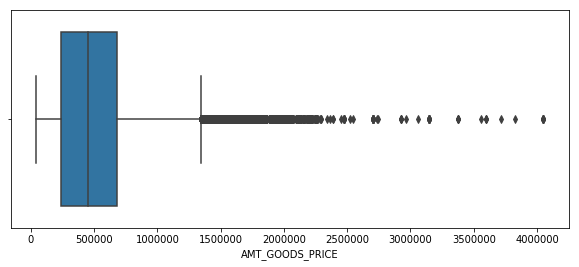

In [40]:
#plotting the boxplot of AMT_GOODS_PRICE variable.
plt.figure(figsize = [10,4])
sns.boxplot(application.AMT_GOODS_PRICE)

In [41]:
application.AMT_GOODS_PRICE.describe()

count    3.072290e+05
mean     5.383977e+05
std      3.694472e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [42]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_GOODS_PRICE = 6.795000e+05 - 2.475000e+05
Lower_Limit_AMT_GOODS_PRICE = 2.475000e+05 - (1.5*IQR_AMT_GOODS_PRICE)
Upper_Limit_AMT_GOODS_PRICE = 6.795000e+05 + (1.5*IQR_AMT_GOODS_PRICE)
print(IQR_AMT_GOODS_PRICE)
print(Lower_Limit_AMT_GOODS_PRICE)
print(Upper_Limit_AMT_GOODS_PRICE)

432000.0
-400500.0
1327500.0


In [43]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 1327500.0 

### dropping the records from AMT_GOODS_PRICE column
application_A = application[ application['AMT_GOODS_PRICE'] >= 1327500.0 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_A, inplace = True)

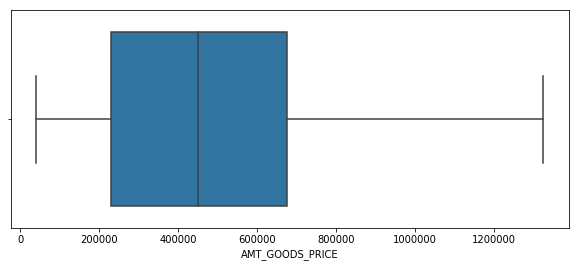

In [44]:
#plotting the boxplot of AMT_GOODS_PRICE variable.
plt.figure(figsize = [10,4])
sns.boxplot(application.AMT_GOODS_PRICE)

In [45]:
## checking for total null values
application.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                        0
AMT_GOODS_PRICE                    0
NAME_TYPE_SUITE                  905
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
O

#### inspecting NAME_TYPE_SUITE column

In [46]:
application.NAME_TYPE_SUITE.value_counts()

Unaccompanied      236541
Family              38085
Spouse, partner     10691
Children             3144
Other_B              1718
Other_A               831
Group of people       260
Name: NAME_TYPE_SUITE, dtype: int64

In [47]:
application.shape

(292175, 72)

In [48]:
### also there are 937 missing values in the NAME_TYPE_SUITE column. Since this is a categorical data we can't replace it 
## with any other imputation. Hence, Deleting these records.
application = application[~application.NAME_TYPE_SUITE.isnull()]

In [49]:
application.shape

(291270, 72)

#### inspecting NAME_INCOME_TYPE column

In [50]:
application.NAME_INCOME_TYPE.value_counts()

Working                 152110
Commercial associate     66209
Pensioner                52924
State servant            19982
Unemployed                  19
Student                     17
Businessman                  5
Maternity leave              4
Name: NAME_INCOME_TYPE, dtype: int64

#### inspecting NAME_EDUCATION_TYPE column

In [51]:
application.NAME_EDUCATION_TYPE.value_counts()

Secondary / secondary special    209930
Higher education                  67656
Incomplete higher                  9777
Lower secondary                    3758
Academic degree                     149
Name: NAME_EDUCATION_TYPE, dtype: int64

#### inspecting NAME_FAMILY_STATUS column

In [52]:
application.NAME_FAMILY_STATUS.value_counts()

Married                 183711
Single / not married     43975
Civil marriage           28813
Separated                19074
Widow                    15697
Name: NAME_FAMILY_STATUS, dtype: int64

#### inspecting NAME_HOUSING_TYPE column

In [53]:
application.NAME_HOUSING_TYPE.value_counts()

House / apartment      257991
With parents            14383
Municipal apartment     10652
Rented apartment         4717
Office apartment         2460
Co-op apartment          1067
Name: NAME_HOUSING_TYPE, dtype: int64

#### inspecting REGION_POPULATION_RELATIVE column

In [54]:
application.REGION_POPULATION_RELATIVE.value_counts()

0.035792    15570
0.046220    11978
0.030755    11594
0.025164    11424
0.026392    10814
0.031329    10790
0.028663    10661
0.019101     8379
0.020713     7688
0.018850     7401
0.072508     7179
0.020246     6909
0.018634     6802
0.022625     6602
0.015221     6593
0.024610     6094
0.032561     5974
0.018029     5926
0.019689     5902
0.018209     5851
0.018801     5808
0.014520     4578
0.016612     4178
0.007020     3962
0.022800     3577
0.010032     3352
0.014464     3219
0.010006     3210
0.004960     3189
0.011703     3120
0.010966     2987
0.010147     2923
0.010643     2908
0.007330     2873
0.011657     2840
0.007120     2786
0.009175     2673
0.006629     2642
0.010500     2608
0.010276     2496
0.009657     2388
0.006852     2334
0.009630     2186
0.008625     2183
0.010556     2093
0.009334     1968
0.007305     1896
0.006207     1849
0.009549     1766
0.008019     1741
0.006008     1729
0.008230     1721
0.003069     1711
0.008474     1672
0.008575     1664
0.008068  

#### inspecting DAYS_BIRTH column 

In [55]:
application.DAYS_BIRTH.value_counts()

-13481    41
-10020    41
-14395    39
-14267    39
-10292    39
-13749    39
-15565    38
-13891    37
-18248    37
-14890    37
-15042    37
-10192    37
-16257    37
-13263    36
-15322    36
-15563    36
-14276    36
-13708    36
-15771    36
-20074    36
-14926    36
-10136    36
-12806    36
-11108    35
-11664    35
-14776    35
-13480    35
-9981     35
-14137    35
-13643    35
-13687    35
-14790    35
-17873    35
-15901    35
-13788    35
-15044    35
-10519    35
-14767    35
-11524    35
-13634    35
-14386    35
-13904    35
-10107    35
-13584    35
-14297    35
-10123    35
-11135    34
-14120    34
-16490    34
-10355    34
-14350    34
-9918     34
-16690    34
-11598    34
-10936    34
-10213    34
-12682    34
-14384    34
-10223    34
-10978    34
-11588    34
-14848    34
-13706    34
-12433    34
-14791    34
-10190    34
-15675    34
-13217    34
-14742    33
-15155    33
-11576    33
-16511    33
-14131    33
-11533    33
-15048    33
-10287    33
-15461    33

In [56]:
#### since all the values are in negative no. we need to change it to positive numbers and
#### storing the values in years in a new column.

application["AGE_YEARS"] = (application.DAYS_BIRTH/-365).round(2)
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.07
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61


In [57]:
application.AGE_YEARS.value_counts()

36.79    124
27.45    121
38.68    120
37.35    118
38.72    117
36.93    117
36.36    115
31.62    115
27.92    113
39.41    113
31.96    113
29.98    113
40.48    112
36.81    111
42.64    111
27.73    110
38.90    110
41.22    110
45.18    110
37.67    110
40.52    109
38.93    109
43.30    109
39.85    108
36.19    108
37.56    108
37.24    108
43.53    108
39.55    108
27.96    108
28.19    107
40.41    107
38.22    107
39.45    107
40.47    107
36.18    107
39.96    106
27.56    106
36.82    106
42.82    106
41.30    106
36.41    106
43.62    105
43.21    105
39.22    105
36.56    105
44.50    105
37.38    105
37.22    105
33.13    105
37.61    104
37.78    104
36.87    104
27.16    104
31.30    104
27.62    104
43.33    104
38.96    103
37.72    103
27.28    103
27.99    103
27.47    103
27.44    103
41.98    103
40.22    103
40.13    102
38.38    102
31.19    102
37.65    102
44.72    102
27.58    102
43.35    102
43.56    102
43.61    102
28.18    102
31.78    102
39.12    102

#### inspecting DAYS_EMPLOYED column

In [58]:
application.DAYS_EMPLOYED.value_counts()

 365243    52935
-200         147
-224         143
-199         142
-230         140
-212         140
-384         134
-188         134
-229         132
-222         131
-215         131
-207         131
-116         130
-216         130
-254         128
-231         128
-196         128
-193         127
-381         127
-213         126
-195         125
-214         125
-237         124
-201         123
-234         122
-233         121
-382         120
-241         120
-185         120
-184         120
-209         119
-194         119
-745         117
-139         117
-198         117
-348         116
-223         115
-129         114
-181         114
-119         113
-118         113
-191         113
-115         113
-268         113
-197         112
-236         112
-218         112
-227         112
-430         112
-244         112
-225         112
-132         112
-106         111
-192         111
-370         111
-228         111
-206         111
-163         110
-391         1

In [59]:
#### since all the values are in negative no. we need to change it to positive numbers and
#### storing the values in years in a new column.

application["EMP_YEARS"] = (application.DAYS_EMPLOYED/-365).round(2)
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.07,8.33
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61,8.32


In [60]:
application.AGE_YEARS.value_counts()

36.79    124
27.45    121
38.68    120
37.35    118
38.72    117
36.93    117
36.36    115
31.62    115
27.92    113
39.41    113
31.96    113
29.98    113
40.48    112
36.81    111
42.64    111
27.73    110
38.90    110
41.22    110
45.18    110
37.67    110
40.52    109
38.93    109
43.30    109
39.85    108
36.19    108
37.56    108
37.24    108
43.53    108
39.55    108
27.96    108
28.19    107
40.41    107
38.22    107
39.45    107
40.47    107
36.18    107
39.96    106
27.56    106
36.82    106
42.82    106
41.30    106
36.41    106
43.62    105
43.21    105
39.22    105
36.56    105
44.50    105
37.38    105
37.22    105
33.13    105
37.61    104
37.78    104
36.87    104
27.16    104
31.30    104
27.62    104
43.33    104
38.96    103
37.72    103
27.28    103
27.99    103
27.47    103
27.44    103
41.98    103
40.22    103
40.13    102
38.38    102
31.19    102
37.65    102
44.72    102
27.58    102
43.35    102
43.56    102
43.61    102
28.18    102
31.78    102
39.12    102

#### inspecting DAYS_REGISTRATION column

In [61]:
application.DAYS_REGISTRATION.value_counts()

-1.0        104
-2.0         89
-6.0         89
-7.0         89
-4.0         82
-5.0         80
-9.0         79
-3.0         77
-10.0        74
-14.0        74
 0.0         72
-21.0        70
-511.0       63
-11.0        62
-34.0        61
-23.0        61
-8.0         61
-56.0        61
-15.0        61
-679.0       60
-735.0       60
-41.0        59
-20.0        59
-742.0       58
-4606.0      58
-393.0       58
-29.0        58
-889.0       58
-923.0       58
-812.0       58
-542.0       58
-19.0        57
-13.0        57
-70.0        57
-389.0       57
-621.0       57
-42.0        56
-69.0        56
-428.0       56
-630.0       56
-569.0       56
-251.0       56
-300.0       56
-854.0       55
-756.0       55
-699.0       55
-203.0       55
-91.0        55
-77.0        54
-363.0       54
-267.0       54
-4256.0      54
-827.0       54
-47.0        54
-477.0       54
-980.0       54
-391.0       54
-342.0       54
-973.0       54
-406.0       54
-308.0       54
-434.0       54
-79.0   

In [62]:
#### since all the values are in negative no. we need to change it to positive numbers and
#### storing the values in years in a new column.

application["RESIGN_YEARS"] = (application.DAYS_REGISTRATION/-365).round(2)
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25,3.25
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.07,8.33,26.94
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61,8.32,11.81


In [63]:
application.RESIGN_YEARS.value_counts()

0.01     328
0.02     318
0.04     234
0.05     222
1.07     202
0.08     195
0.19     194
1.04     194
0.15     193
0.88     192
2.05     188
0.13     188
0.90     187
1.82     187
0.82     187
1.19     186
0.98     185
0.24     185
2.30     185
2.02     185
1.70     184
0.12     182
1.01     182
0.03     182
1.99     182
1.90     181
1.84     181
0.50     181
2.07     181
2.36     180
1.08     180
0.39     179
2.15     179
0.35     179
0.56     179
0.53     178
1.59     178
1.02     178
0.06     178
0.25     178
2.22     177
1.73     177
0.00     176
0.78     175
12.45    175
2.55     175
1.52     175
0.73     175
3.01     174
2.16     174
0.67     173
2.61     173
0.84     173
0.10     173
2.32     173
1.42     173
0.44     172
1.67     172
0.99     172
0.38     172
2.28     172
2.68     172
0.07     172
2.53     171
2.67     171
1.48     171
0.18     171
1.44     171
2.13     170
2.12     170
1.75     169
0.75     169
1.05     169
2.25     168
0.30     168
11.36    168
1.61     168

#### inspecting DAYS_ID_PUBLISH column

In [64]:
application.DAYS_ID_PUBLISH.value_counts()

-4046    161
-4053    158
-4095    152
-4200    151
-4220    149
-4256    149
-4417    149
-4285    149
-4151    148
-4263    147
-4032    146
-4047    146
-4130    145
-4144    145
-4214    145
-4171    144
-4270    144
-4320    143
-4319    142
-4215    142
-4096    142
-4221    142
-4166    141
-4375    141
-4291    140
-4536    140
-4025    139
-4074    139
-4109    139
-4382    138
-4073    138
-4389    138
-4312    137
-4017    137
-4039    137
-4103    136
-4186    136
-4137    136
-4193    135
-4376    135
-4236    135
-4100    134
-4264    134
-4452    133
-4305    133
-4368    133
-4145    133
-4116    133
-4087    133
-4066    133
-4445    133
-4061    132
-4081    132
-4172    132
-4194    132
-4067    132
-4126    131
-4123    131
-4158    131
-4571    131
-4396    131
-4298    131
-4250    130
-4271    130
-4206    130
-4438    130
-4340    130
-4370    130
-4404    130
-4383    130
-4143    129
-4276    129
-4591    129
-4129    129
-4390    129
-4262    129
-4410    129

In [65]:
#### since all the values are in negative no. we need to change it to positive numbers and
#### storing the values in years in a new column.

application["YEARS_ID_PUBLISH"] = (application.DAYS_ID_PUBLISH/-365).round(2)
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99,5.81
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25,3.25,0.80
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67,6.93
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.07,8.33,26.94,6.68
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61,8.32,11.81,9.47


In [66]:
application.YEARS_ID_PUBLISH.value_counts()

11.22    538
11.68    525
11.16    517
11.55    511
11.56    511
11.32    505
11.24    503
11.08    502
11.35    499
11.18    499
11.70    494
11.99    490
11.76    489
11.33    485
11.05    484
11.61    483
11.30    480
11.10    480
11.41    479
12.10    477
11.01    476
11.39    476
11.47    475
12.01    475
11.62    471
12.16    469
11.07    466
11.85    465
11.64    465
11.79    464
11.28    462
11.48    461
11.72    460
11.21    460
12.58    460
11.42    456
12.18    454
11.52    453
12.07    453
11.95    452
11.25    452
11.87    451
11.13    450
11.12    449
11.36    449
11.75    449
12.02    447
11.58    447
11.45    446
11.78    445
12.42    445
11.93    443
11.50    443
12.12    443
11.81    442
12.52    442
12.25    441
11.44    440
12.22    439
12.24    439
10.99    438
12.04    438
12.32    438
11.38    438
11.84    437
11.15    437
11.04    435
11.73    435
12.56    433
12.08    432
12.21    430
12.44    429
11.98    429
11.82    429
12.64    428
12.19    426
12.36    426

In [67]:
### checking for null values percentge in dataset
(application.isnull().sum()*100/len(application)).round(2)

SK_ID_CURR                      0.00
TARGET                          0.00
NAME_CONTRACT_TYPE              0.00
CODE_GENDER                     0.00
FLAG_OWN_CAR                    0.00
FLAG_OWN_REALTY                 0.00
CNT_CHILDREN                    0.00
AMT_INCOME_TOTAL                0.00
AMT_CREDIT                      0.00
AMT_ANNUITY                     0.00
AMT_GOODS_PRICE                 0.00
NAME_TYPE_SUITE                 0.00
NAME_INCOME_TYPE                0.00
NAME_EDUCATION_TYPE             0.00
NAME_FAMILY_STATUS              0.00
NAME_HOUSING_TYPE               0.00
REGION_POPULATION_RELATIVE      0.00
DAYS_BIRTH                      0.00
DAYS_EMPLOYED                   0.00
DAYS_REGISTRATION               0.00
DAYS_ID_PUBLISH                 0.00
FLAG_MOBIL                      0.00
FLAG_EMP_PHONE                  0.00
FLAG_WORK_PHONE                 0.00
FLAG_CONT_MOBILE                0.00
FLAG_PHONE                      0.00
FLAG_EMAIL                      0.00
O

In [68]:
application.shape

(291270, 76)

#### inspecting OCCUPATION_TYPE column

In [69]:
application.OCCUPATION_TYPE.value_counts()

Laborers                 53097
Sales staff              30929
Core staff               25743
Managers                 18936
Drivers                  17683
High skill tech staff    10590
Accountants               8880
Medicine staff            8149
Security staff            6512
Cooking staff             5813
Cleaning staff            4576
Private service staff     2491
Low-skill Laborers        2071
Waiters/barmen staff      1313
Secretaries               1242
Realty agents              710
HR staff                   507
IT staff                   474
Name: OCCUPATION_TYPE, dtype: int64

In [70]:
#### Also there are a total of 31.45% or 93960 no. of missing values. 
#### Since these are catgorical values we can impute these missing values with "NAN"
application["OCCUPATION_TYPE"]= application["OCCUPATION_TYPE"].fillna("NaN")

In [71]:
application.OCCUPATION_TYPE.value_counts()

NaN                      91554
Laborers                 53097
Sales staff              30929
Core staff               25743
Managers                 18936
Drivers                  17683
High skill tech staff    10590
Accountants               8880
Medicine staff            8149
Security staff            6512
Cooking staff             5813
Cleaning staff            4576
Private service staff     2491
Low-skill Laborers        2071
Waiters/barmen staff      1313
Secretaries               1242
Realty agents              710
HR staff                   507
IT staff                   474
Name: OCCUPATION_TYPE, dtype: int64

#### inspecting ORGANIZATION_TYPE column

In [72]:
application.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    63811
XNA                       52935
Self-employed             36861
Other                     15770
Medicine                  10599
Business Entity Type 2    10005
Government                 9841
School                     8384
Trade: type 7              7463
Kindergarten               6591
Construction               6339
Business Entity Type 1     5602
Transport: type 4          5084
Trade: type 3              3340
Industry: type 3           3173
Industry: type 9           3107
Security                   3092
Housing                    2792
Industry: type 11          2593
Military                   2402
Agriculture                2384
Bank                       2297
Postal                     2096
Transport: type 2          2095
Police                     2083
Security Ministries        1790
Trade: type 2              1765
Restaurant                 1748
Services                   1495
Industry: type 7           1246
University                 1212
Transpor

In [73]:
#### In this column there are a total of 54248 no. of XNA or junk records. Dropping these records.
### dropping the records from ORGANIZATION_TYPE column
application_B = application[ application['ORGANIZATION_TYPE'] == "XNA" ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_B, inplace = True)

In [74]:
application.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    63811
Self-employed             36861
Other                     15770
Medicine                  10599
Business Entity Type 2    10005
Government                 9841
School                     8384
Trade: type 7              7463
Kindergarten               6591
Construction               6339
Business Entity Type 1     5602
Transport: type 4          5084
Trade: type 3              3340
Industry: type 3           3173
Industry: type 9           3107
Security                   3092
Housing                    2792
Industry: type 11          2593
Military                   2402
Agriculture                2384
Bank                       2297
Postal                     2096
Transport: type 2          2095
Police                     2083
Security Ministries        1790
Trade: type 2              1765
Restaurant                 1748
Services                   1495
Industry: type 7           1246
University                 1212
Transport: type 3          1153
Industry

In [75]:
#### checking the shape of the dataset
application.shape

(238335, 76)

#### inspecting EXT_SOURCE_2 column

In [76]:
application.EXT_SOURCE_2.isnull().sum()

492

In [77]:
application.EXT_SOURCE_2.describe()

count    2.378430e+05
mean     5.121534e-01
std      1.906500e-01
min      8.173617e-08
25%      3.917251e-01
50%      5.628325e-01
75%      6.609613e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64

In [78]:
#### since there are 501 missing values in the EXT_SOURCE_2 column we can impute the median value '5.628325e-01' for these missing data.

application["EXT_SOURCE_2"]= application["EXT_SOURCE_2"].fillna(5.628325e-01)

In [79]:
### again checking the no. of missing values
application.EXT_SOURCE_2.isnull().sum()

0

#### inspecting OBS_30_CNT_SOCIAL_CIRCLE column

In [80]:
### checking the no. of null values
application.OBS_30_CNT_SOCIAL_CIRCLE.isnull().sum()

797

In [81]:
#### Since this column contains categorical values in 0 and 1 we can delete these records.
application = application[~application.OBS_30_CNT_SOCIAL_CIRCLE.isnull()]

In [82]:
### checking the null values again
application.OBS_30_CNT_SOCIAL_CIRCLE.isnull().sum()

0

#### inspecting AMT_REQ_CREDIT_BUREAU_HOUR column

In [83]:
### checking the no. of null values
application.AMT_REQ_CREDIT_BUREAU_HOUR.isnull().sum()

32302

In [84]:
#### Since this column contains a lot of missing values, deleting these records.
application = application[~application.AMT_REQ_CREDIT_BUREAU_HOUR.isnull()]

In [85]:
### verifying the no. of null values
application.AMT_REQ_CREDIT_BUREAU_HOUR.isnull().sum()

0

In [86]:
### checking the shape of the dataset
application.shape

(205236, 76)

In [87]:
## checking for total null values
application.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RAT

In [88]:
# XNA and XAP are replaced by NaN
application=application.replace('XNA', np.NaN)
application=application.replace('XAP', np.NaN)

## checking for outlier values

#### inspecting AMT_INCOME_TOTAL column

In [89]:
application.AMT_INCOME_TOTAL.describe()

count    2.052360e+05
mean     1.728360e+05
std      2.750531e+05
min      2.655000e+04
25%      1.125000e+05
50%      1.575000e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

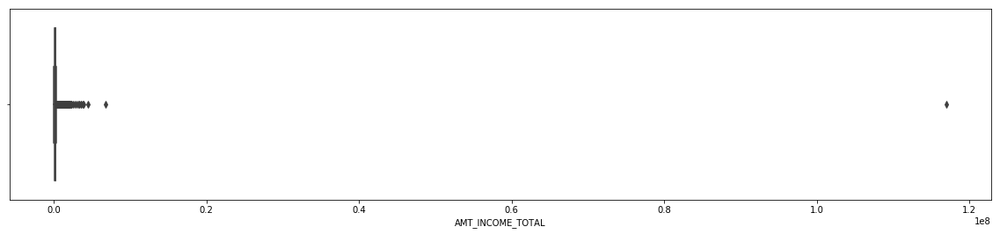

In [90]:
#plotting the boxplot of AMT_INCOME_TOTAL variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_INCOME_TOTAL)

In [91]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_INCOME_TOTAL = 2.025000e+05 - 1.125000e+05
Lower_Limit_AMT_INCOME_TOTAL = 1.125000e+05 - (1.5*IQR_AMT_INCOME_TOTAL)
Upper_Limit_AMT_INCOME_TOTAL = 2.025000e+05 + (1.5*IQR_AMT_INCOME_TOTAL)
print(IQR_AMT_INCOME_TOTAL)
print(Lower_Limit_AMT_INCOME_TOTAL)
print(Upper_Limit_AMT_INCOME_TOTAL)

90000.0
-22500.0
337500.0


In [92]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 337500.0 

### dropping the records from AMT_INCOME_TOTAL column
application_1 = application[ application['AMT_INCOME_TOTAL'] >= 337500.0 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_1, inplace = True)

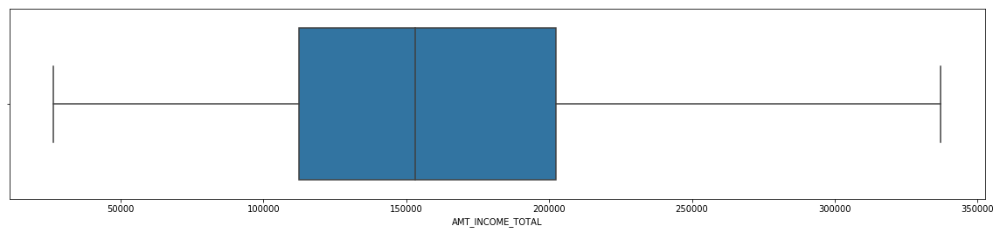

In [93]:
#plotting the boxplot of AMT_INCOME_TOTAL variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_INCOME_TOTAL)

#### inspecting AMT_CREDIT column

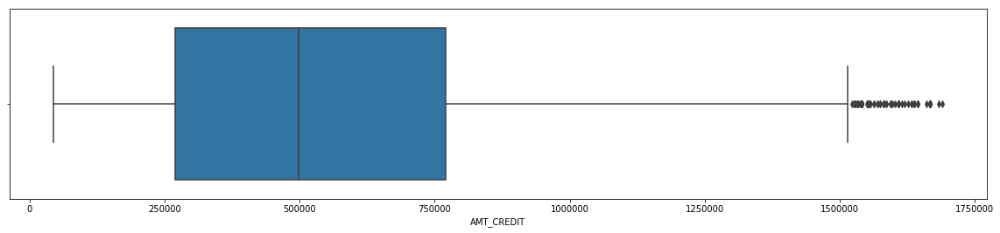

In [94]:
#plotting the boxplot of AMT_CREDIT variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_CREDIT)

In [95]:
application.AMT_CREDIT.describe()

count    1.948860e+05
mean     5.506483e+05
std      3.223349e+05
min      4.500000e+04
25%      2.700000e+05
50%      4.975200e+05
75%      7.702920e+05
max      1.689736e+06
Name: AMT_CREDIT, dtype: float64

In [96]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_CREDIT = 7.702920e+05 - 2.700000e+05
Lower_Limit_AMT_CREDIT = 2.700000e+05 - (1.5*IQR_AMT_CREDIT)
Upper_Limit_AMT_CREDIT = 7.702920e+05 + (1.5*IQR_AMT_CREDIT)
print(IQR_AMT_CREDIT)
print(Lower_Limit_AMT_CREDIT)
print(Upper_Limit_AMT_CREDIT)

500292.0
-480438.0
1520730.0


In [97]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 1520730.0
### dropping the records from AMT_CREDIT column
application_2 = application[ application['AMT_CREDIT'] >= 1520730.0 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_2, inplace = True)

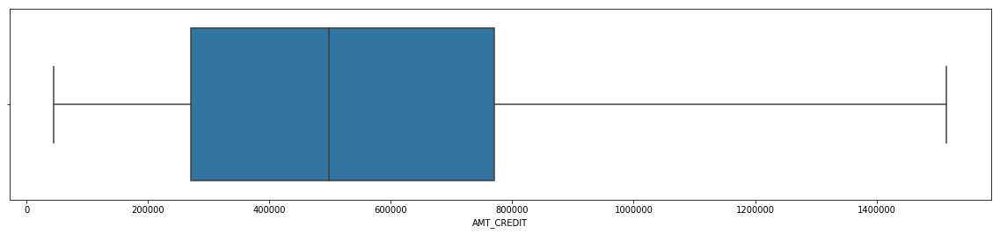

In [98]:
#plotting the boxplot of AMT_CREDIT variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_CREDIT)

#### checking the AMT_ANNUITY variable.

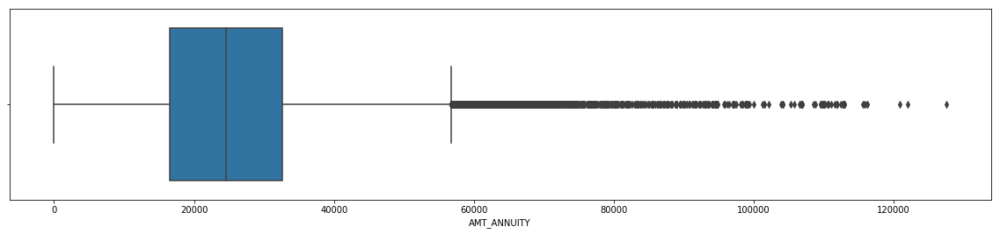

In [99]:
#plotting the boxplot of AMT_ANNUITY variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_ANNUITY)

In [100]:
application.AMT_ANNUITY.describe()

count    194770.000000
mean      25805.403804
std       12305.145689
min           0.000000
25%       16564.500000
50%       24583.500000
75%       32625.000000
max      127507.500000
Name: AMT_ANNUITY, dtype: float64

In [101]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_ANNUITY = 32625.000000 - 16564.500000
Lower_Limit_AMT_ANNUITY = 16564.500000 - (1.5*IQR_AMT_ANNUITY)
Upper_Limit_AMT_ANNUITY = 32625.000000 + (1.5*IQR_AMT_ANNUITY)
print(IQR_AMT_ANNUITY)
print(Lower_Limit_AMT_ANNUITY)
print(Upper_Limit_AMT_ANNUITY)

16060.5
-7526.25
56715.75


In [102]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 56715.75
### dropping the records from AMT_ANNUITY column
application_3 = application[ application['AMT_ANNUITY'] >= 56715.75 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_3, inplace = True)

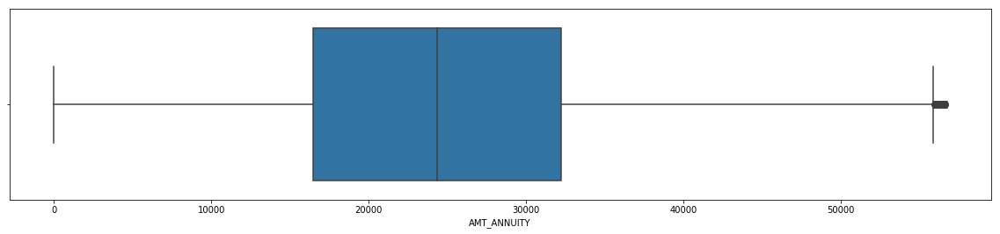

In [103]:
#plotting the boxplot of AMT_ANNUITY variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AMT_ANNUITY)

#### checking the AGE_YEARS variable.

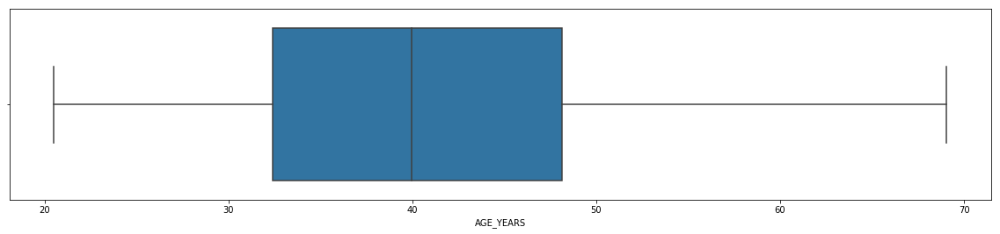

In [104]:
#plotting the boxplot of AGE_YEARS variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.AGE_YEARS)

#### checking the EMP_YEARS variable.

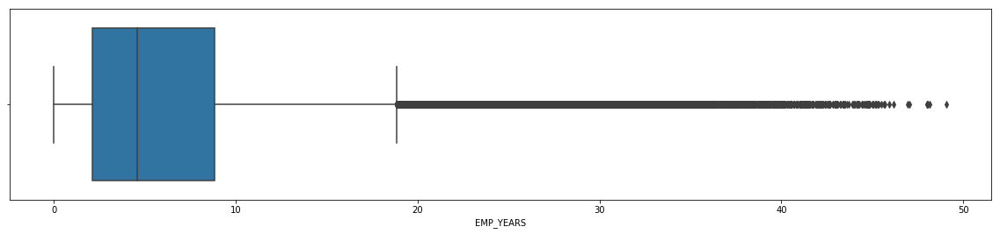

In [105]:
#plotting the boxplot of EMP_YEARS variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.EMP_YEARS)

In [106]:
application.EMP_YEARS.describe()

count    191585.000000
mean          6.628030
std           6.495532
min           0.000000
25%           2.130000
50%           4.580000
75%           8.810000
max          49.070000
Name: EMP_YEARS, dtype: float64

In [107]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_EMP_YEARS = 8.810000 - 2.130000
Lower_Limit_EMP_YEARS = 2.130000 - (1.5*IQR_EMP_YEARS)
Upper_Limit_EMP_YEARS = 8.810000 + (1.5*IQR_EMP_YEARS)
print(IQR_EMP_YEARS)
print(Lower_Limit_EMP_YEARS)
print(Upper_Limit_EMP_YEARS)

6.680000000000001
-7.8900000000000015
18.830000000000002


In [108]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 18.83
### dropping the records from EMP_YEARS column
application_4 = application[ application['EMP_YEARS'] >= 18.830000000000002 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_4, inplace = True)

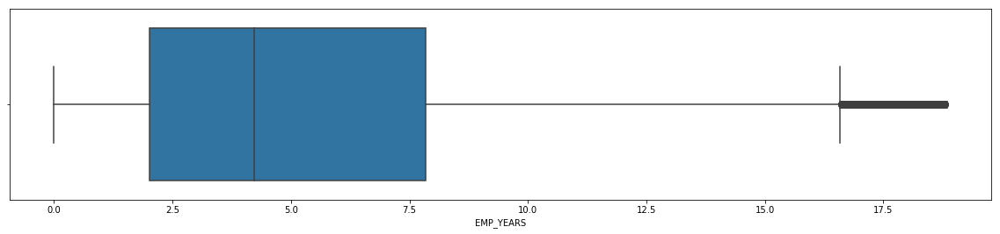

In [109]:
#plotting the boxplot of EMP_YEARS variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.EMP_YEARS)

#### checking the RESIGN_YEARS  variable

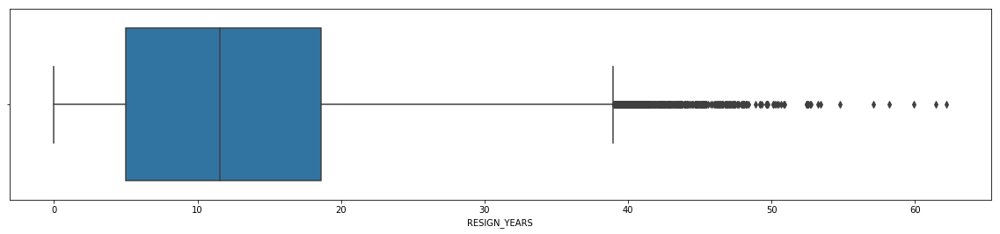

In [110]:
#plotting the boxplot of RESIGN_YEARS variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.RESIGN_YEARS)

In [111]:
application.RESIGN_YEARS.describe()

count    179832.000000
mean         12.472930
std           8.745899
min           0.000000
25%           4.970000
50%          11.530000
75%          18.580000
max          62.190000
Name: RESIGN_YEARS, dtype: float64

In [112]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_RESIGN_YEARS = 18.580000 - 4.970000
Lower_Limit_RESIGN_YEARS= 4.970000 - (1.5*IQR_RESIGN_YEARS)
Upper_Limit_RESIGN_YEARS = 18.580000 + (1.5*IQR_RESIGN_YEARS)
print(IQR_RESIGN_YEARS)
print(Lower_Limit_RESIGN_YEARS)
print(Upper_Limit_RESIGN_YEARS)

13.61
-15.445
38.995


In [113]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 38.995
### dropping the records from RESIGN_YEARS column
application_5 = application[ application['RESIGN_YEARS'] >= 38.995 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_5, inplace = True)

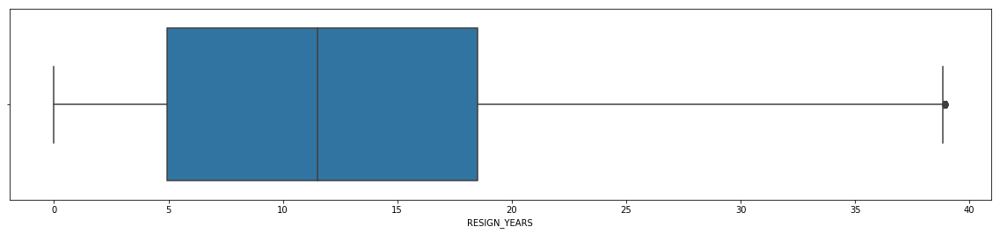

In [114]:
#plotting the boxplot of RESIGN_YEARS variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.RESIGN_YEARS)

#### checking the CNT_CHILDREN variable¶

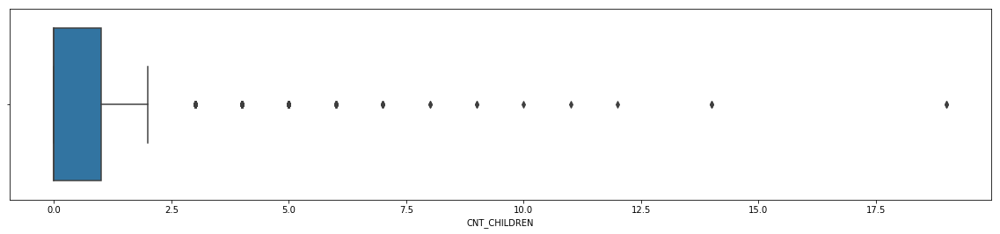

In [115]:
#plotting the boxplot of CNT_CHILDREN variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.CNT_CHILDREN )

In [116]:
application.CNT_CHILDREN.describe()

count    179344.000000
mean          0.522644
std           0.775324
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64

In [117]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_CNT_CHILDREN = 1 - 0
Lower_Limit_CNT_CHILDREN= 0 - (1.5*IQR_CNT_CHILDREN)
Upper_Limit_CNT_CHILDREN = 1 + (1.5*IQR_CNT_CHILDREN)
print(IQR_CNT_CHILDREN)
print(Lower_Limit_CNT_CHILDREN)
print(Upper_Limit_CNT_CHILDREN)

1
-1.5
2.5


In [118]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 2.5
### dropping the records from CNT_CHILDREN column
application_6 = application[ application['CNT_CHILDREN'] >= 2.5 ].index 
  
# drop these row indexes from dataFrame 
application.drop(application_6, inplace = True)

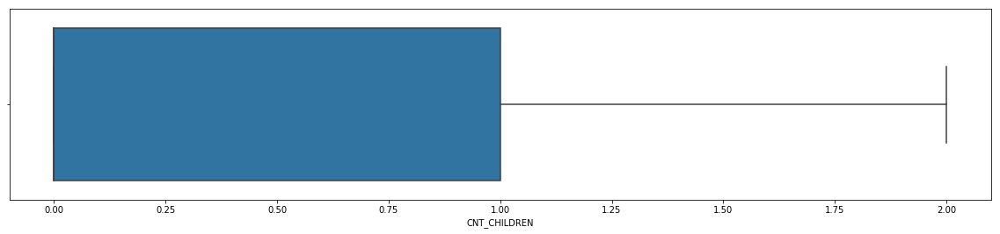

In [119]:
#plotting the boxplot of CNT_CHILDREN variable.
plt.figure(figsize = [20,4])
sns.boxplot(application.CNT_CHILDREN )

## Binning of numeriacal variables

In [120]:
application.AMT_INCOME_TOTAL.describe()

count    176246.000000
mean     157227.980320
std       60704.903419
min       26550.000000
25%      112500.000000
50%      148500.000000
75%      202500.000000
max      337050.000000
Name: AMT_INCOME_TOTAL, dtype: float64

In [121]:
application.AMT_CREDIT.describe()

count    1.762460e+05
mean     5.409291e+05
std      3.185659e+05
min      4.500000e+04
25%      2.700000e+05
50%      4.900050e+05
75%      7.551900e+05
max      1.515100e+06
Name: AMT_CREDIT, dtype: float64

In [122]:
application.AMT_ANNUITY.describe()

count    176246.000000
mean      25102.144520
std       11142.096858
min           0.000000
25%       16389.000000
50%       24363.000000
75%       32166.000000
max       56713.500000
Name: AMT_ANNUITY, dtype: float64

In [123]:
application.AMT_GOODS_PRICE.describe()

count    1.762460e+05
mean     4.817546e+05
std      2.844461e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.750000e+05
max      1.323000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [124]:
## Binning of AMT_CREDIT and AMT_GOODS_PRICE
bins = [0,100000,250000,500000,750000,1000000, 1250000, 1500000, 1750000]
ranges = ['0-100000','100000-250000','250000-500000','500000-750000','750000-1000000', '1000000-1250000',
          '1250000-1500000','1500000-above']


application['AMT_CREDIT_RANGE'] = pd.cut(application['AMT_CREDIT'],bins,labels=ranges)
application['AMT_GOODS_PRICE_RANGE'] = pd.cut(application['AMT_GOODS_PRICE'],bins,labels=ranges)

In [125]:
application.AMT_CREDIT_RANGE.value_counts()

250000-500000      56431
500000-750000      39070
100000-250000      31455
750000-1000000     25397
1000000-1250000    14677
1250000-1500000     5867
0-100000            3333
1500000-above         16
Name: AMT_CREDIT_RANGE, dtype: int64

In [126]:
## Binning of AMT_GOODS_PRICE
bins0 = [0,100000,250000,500000,750000,1000000, 1250000, 1500000]
ranges0 = ['0-100000','100000-250000','250000-500000','500000-750000','750000-1000000', '1000000-1250000',
          '1250000-above']


application['AMT_GOODS_PRICE_RANGE'] = pd.cut(application['AMT_GOODS_PRICE'],bins0,labels=ranges0)

In [127]:
application.AMT_GOODS_PRICE_RANGE.value_counts()

250000-500000      62485
100000-250000      44971
500000-750000      33541
750000-1000000     19573
1000000-1250000     9925
0-100000            4942
1250000-above        809
Name: AMT_GOODS_PRICE_RANGE, dtype: int64

In [128]:
## Binning of AMT_INCOME_TOTAL
bins1 = [0,50000,100000,150000,200000,250000, 300000, 350000]
ranges1 = ['0-50000','50000-100000','100000-150000','150000-200000','200000-250000', '250000-300000',
          '300000-above']


application['AMT_INCOME_TOTAL_RANGE'] = pd.cut(application['AMT_INCOME_TOTAL'],bins1,labels=ranges1)

In [129]:
application.AMT_INCOME_TOTAL_RANGE.value_counts()

100000-150000    56751
150000-200000    41661
200000-250000    30932
50000-100000     30797
250000-300000    10598
300000-above      4155
0-50000           1352
Name: AMT_INCOME_TOTAL_RANGE, dtype: int64

In [130]:
## Binning of AMT_ANNUITY
bins2 = [0,10000,20000,30000,40000,50000, 60000]
ranges2 = ['0-10000','10000-20000','20000-30000','30000-40000','40000-50000', '50000-above']


application['AMT_ANNUITY_RANGE'] = pd.cut(application['AMT_ANNUITY'],bins2,labels=ranges2)

In [131]:
application.AMT_ANNUITY_RANGE.value_counts()

20000-30000    58035
10000-20000    49135
30000-40000    36968
40000-50000    13926
0-10000        13520
50000-above     4651
Name: AMT_ANNUITY_RANGE, dtype: int64

In [132]:
application.AGE_YEARS.describe()

count    176246.000000
mean         39.910662
std           9.843496
min          20.520000
25%          31.870000
50%          39.200000
75%          47.300000
max          68.990000
Name: AGE_YEARS, dtype: float64

In [133]:
## Binning of AGE_YEARS
bins3 = [20,30,40,50,60,70]
ranges3 = ['20 to 30 years','30 to 40 years','40 to 50 years','50 to 60 years','60 years and above']


application['AGE_YEARS_RANGE'] = pd.cut(application['AGE_YEARS'],bins3,labels=ranges3)

In [134]:
application.AGE_YEARS_RANGE.value_counts()

30 to 40 years        60224
40 to 50 years        51026
20 to 30 years        32879
50 to 60 years        28584
60 years and above     3533
Name: AGE_YEARS_RANGE, dtype: int64

### `with this we have finished the data cleaning part for application dataset.`

In [135]:
application.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176246 entries, 0 to 307510
Data columns (total 81 columns):
SK_ID_CURR                     176246 non-null int64
TARGET                         176246 non-null int64
NAME_CONTRACT_TYPE             176246 non-null object
CODE_GENDER                    176246 non-null object
FLAG_OWN_CAR                   176246 non-null object
FLAG_OWN_REALTY                176246 non-null object
CNT_CHILDREN                   176246 non-null int64
AMT_INCOME_TOTAL               176246 non-null float64
AMT_CREDIT                     176246 non-null float64
AMT_ANNUITY                    176246 non-null float64
AMT_GOODS_PRICE                176246 non-null float64
NAME_TYPE_SUITE                176246 non-null object
NAME_INCOME_TYPE               176246 non-null object
NAME_EDUCATION_TYPE            176246 non-null object
NAME_FAMILY_STATUS             176246 non-null object
NAME_HOUSING_TYPE              176246 non-null object
REGION_POPULATION_RELATI

In [136]:
application.shape

(176246, 81)

<font size=5px color=blue>Checking For Data Imbalance </font>

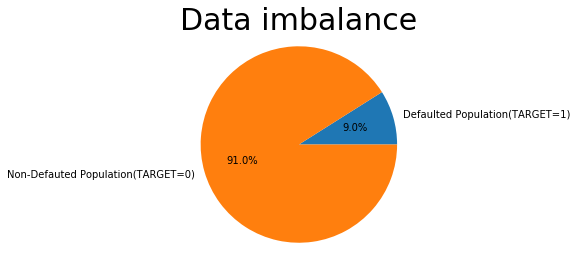

In [137]:
Defaulted = 0 
NonDefaulted = 0
for i in application['TARGET'].values:
    if i == 1:
        Defaulted += 1
    else:
        NonDefaulted += 1
        
Defaulted = (Defaulted/len(application['TARGET']))*100
NonDefaulted = (NonDefaulted/len(application['TARGET']))*100

x = ['Defaulted Population(TARGET=1)','Non-Defauted Population(TARGET=0)']
y = [Defaulted, NonDefaulted]


fig1, ax1 = plt.subplots()
ax1.pie(y, labels=x ,autopct='%1.1f%%')
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Data imbalance',fontsize=30)
plt.show()

## Lets separate the total dataset into two parts to perform categorical Univariate analysis on both.
- Non-defaulted Population(Target=0)
- Defaulted Population(Target=1)

In [138]:
# Non-Defaulter
application_0 =application[application.TARGET==0]
application_0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25,3.25,0.80,1250000-1500000,1000000-1250000,250000-300000,30000-40000,40 to 50 years
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67,6.93,100000-250000,100000-250000,50000-100000,0-10000,50 to 60 years
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61,8.32,11.81,9.47,500000-750000,500000-750000,100000-150000,20000-30000,50 to 60 years
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,46.41,4.35,13.62,1.31,250000-500000,250000-500000,50000-100000,20000-30000,40 to 50 years
10,100014,0,Cash loans,F,N,Y,1,112500.0,652500.0,21177.0,652500.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.022800,-10197,-679,-4427.0,-738,1,1,0,1,0,0,Core staff,3.0,2,2,SATURDAY,15,0,0,0,0,0,0,Medicine,0.651862,0.0,0.0,0.0,0.0,-844.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,27.94,1.86,12.13,2.02,500000-750000,500000-750000,100000-150000,20000-30000,20 to 30 years


In [139]:
# Defaulters
application_1 =application[application.TARGET==1]
application_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99,5.81,250000-500000,250000-500000,200000-250000,20000-30000,20 to 30 years
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,702000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,-18724,-2628,-6573.0,-1827,1,1,0,1,0,0,Cooking staff,1.0,3,2,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.548477,10.0,1.0,10.0,0.0,-161.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0,51.30,7.20,18.01,5.01,750000-1000000,500000-750000,100000-150000,20000-30000,50 to 60 years
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,855000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.025164,-17482,-1262,-1182.0,-1029,1,1,0,1,0,0,Laborers,2.0,2,2,TUESDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.306841,0.0,0.0,0.0,0.0,-1075.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0,47.90,3.46,3.24,2.82,1000000-1250000,750000-1000000,200000-250000,30000-40000,40 to 50 years
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,238500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.007305,-13384,-3597,-45.0,-4409,1,1,1,1,1,0,Sales staff,2.0,3,3,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.674203,1.0,0.0,1.0,0.0,-1480.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,36.67,9.85,0.12,12.08,250000-500000,100000-250000,100000-150000,10000-20000,30 to 40 years
110,100130,1,Cash loans,F,N,Y,1,157500.0,723996.0,30802.5,585000.0,Unaccompanied,Commercial associate,Incomplete higher,Separated,House / apartment,0.007274,-10526,-267,-387.0,-3190,1,1,0,1,1,0,Sales staff,2.0,2,2,SUNDAY,12,0,1,1,0,1,1,Trade: type 2,0.282069,0.0,0.0,0.0,0.0,-56.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,28.84,0.73,1.06,8.74,500000-750000,500000-750000,150000-200000,30000-40000,20 to 30 years


<font size=4px color=blue>1.Categorical Univariate Analysis

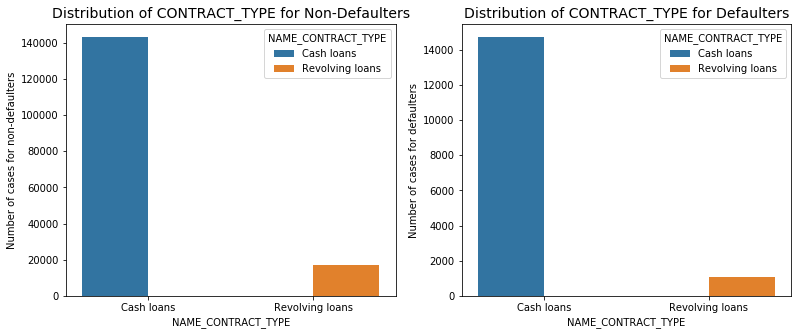

In [140]:
# Contract type and their count
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.NAME_CONTRACT_TYPE,hue = "NAME_CONTRACT_TYPE", data=application_0)
plt.title('Distribution of CONTRACT_TYPE for Non-Defaulters', fontsize=14)
plt.xlabel("NAME_CONTRACT_TYPE")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.NAME_CONTRACT_TYPE, hue = "NAME_CONTRACT_TYPE",data=application_1)
plt.title('Distribution of CONTRACT_TYPE for Defaulters', fontsize=14)
plt.xlabel("NAME_CONTRACT_TYPE")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: Less defaulters for Revolving loans


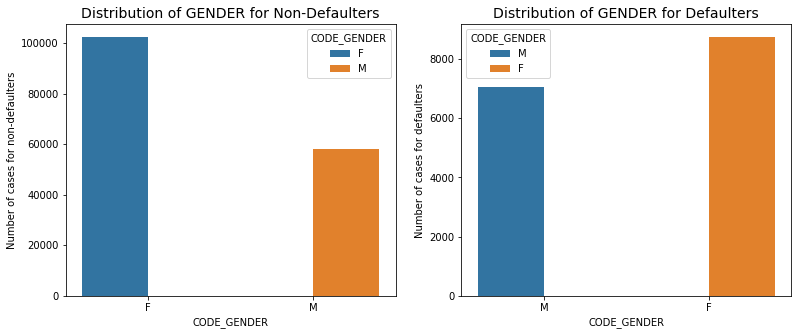

In [141]:
# Gender distribution and their count
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.CODE_GENDER,hue = "CODE_GENDER", data=application_0)
plt.title('Distribution of GENDER for Non-Defaulters', fontsize=14)
plt.xlabel("CODE_GENDER")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.CODE_GENDER,hue = "CODE_GENDER", data=application_1)
plt.title('Distribution of GENDER for Defaulters', fontsize=14)
plt.xlabel("CODE_GENDER")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for defaulters')
plt.show()

## INFERENCE: Male tends to be more Defaulters

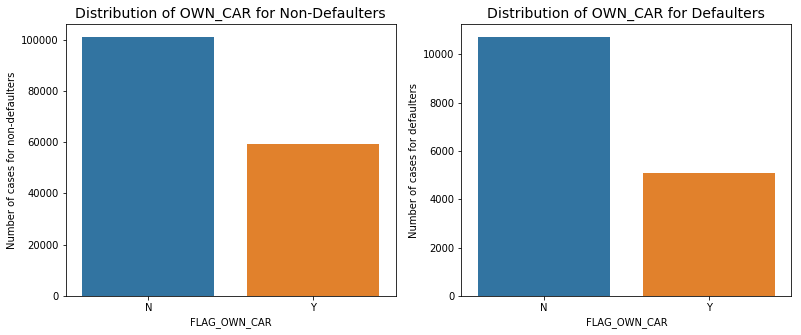

In [142]:
# Own a car or not and their distribution
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.FLAG_OWN_CAR)
plt.title('Distribution of OWN_CAR for Non-Defaulters', fontsize=14)
plt.xlabel("FLAG_OWN_CAR")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.FLAG_OWN_CAR)
plt.title('Distribution of OWN_CAR for Defaulters', fontsize=14)
plt.xlabel("FLAG_OWN_CAR")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for defaulters')
plt.show()

## INFERENCE: People own cars Defaults less

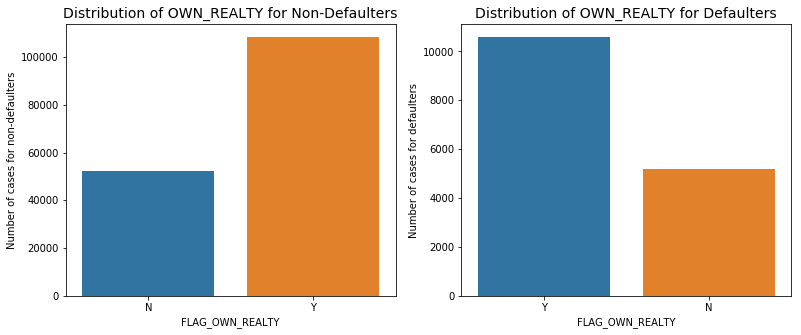

In [143]:
# Qwn their own Realty or not and their distribution
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.FLAG_OWN_REALTY)
plt.title('Distribution of OWN_REALTY for Non-Defaulters', fontsize=14)
plt.xlabel("FLAG_OWN_REALTY")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.FLAG_OWN_REALTY)
plt.title('Distribution of OWN_REALTY for Defaulters', fontsize=14)
plt.xlabel("FLAG_OWN_REALTY")
plt.xticks(rotation=0)
plt.ylabel('Number of cases for defaulters')
plt.show()

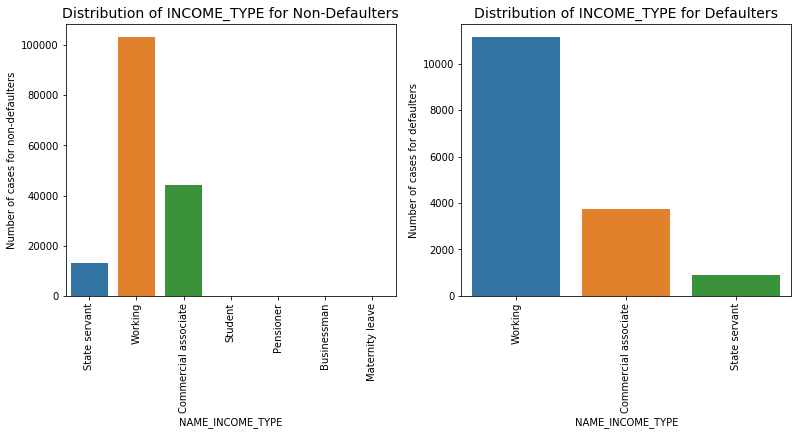

In [144]:
# Income type and their distribution
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.NAME_INCOME_TYPE)
plt.title('Distribution of INCOME_TYPE for Non-Defaulters', fontsize=14)
plt.xlabel("NAME_INCOME_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.NAME_INCOME_TYPE)
plt.title('Distribution of INCOME_TYPE for Defaulters', fontsize=14)
plt.xlabel("NAME_INCOME_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference:  Proportion of Working in Defaulters is maximum , where State servant and Commercial Associate is less in Defaulters

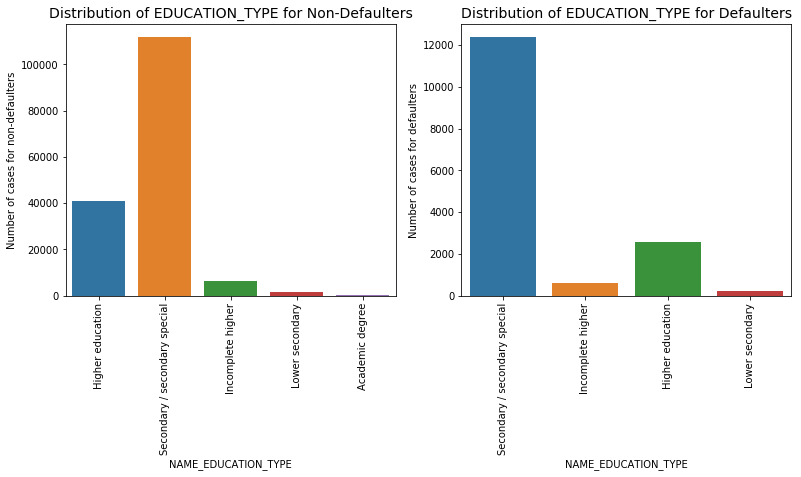

In [145]:
# Education type and their distribution
plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(application_0.NAME_EDUCATION_TYPE)
plt.title('Distribution of EDUCATION_TYPE for Non-Defaulters', fontsize=14)
plt.xlabel("NAME_EDUCATION_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(application_1.NAME_EDUCATION_TYPE)
plt.title('Distribution of EDUCATION_TYPE for Defaulters', fontsize=14)
plt.xlabel("NAME_EDUCATION_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People with Higher Education tends to Default less.

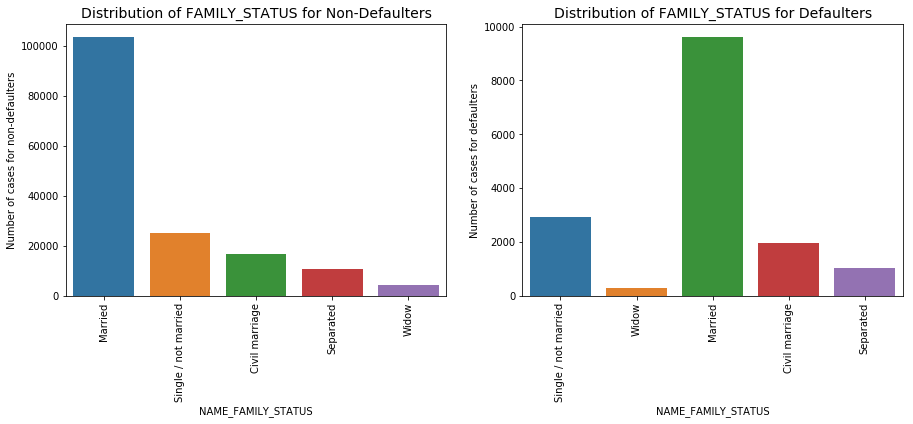

In [146]:
# Family Status and their distribution 
plt.figure(figsize=(15,5))
plt.subplot(1,2, 1)
sns.countplot(application_0.NAME_FAMILY_STATUS)
plt.title('Distribution of FAMILY_STATUS for Non-Defaulters', fontsize=14)
plt.xlabel("NAME_FAMILY_STATUS")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2, 2)
sns.countplot(application_1.NAME_FAMILY_STATUS)
plt.title('Distribution of FAMILY_STATUS for Defaulters', fontsize=14)
plt.xlabel("NAME_FAMILY_STATUS")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: Proportion of Single/Not married and Civil Marriage tend to default more.


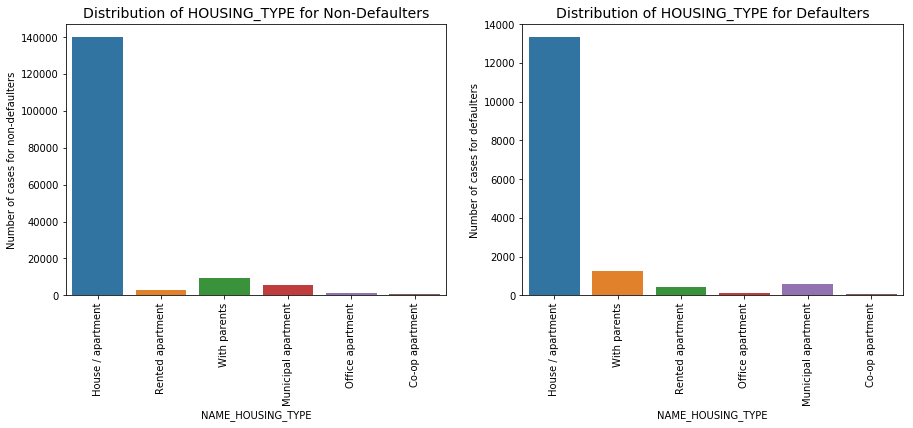

In [147]:
# Housing type and their distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2, 1)
sns.countplot(application_0.NAME_HOUSING_TYPE)
plt.title('Distribution of HOUSING_TYPE for Non-Defaulters', fontsize=14)
plt.xlabel("NAME_HOUSING_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2, 2)
sns.countplot(application_1.NAME_HOUSING_TYPE)
plt.title('Distribution of HOUSING_TYPE for Defaulters', fontsize=14)
plt.xlabel("NAME_HOUSING_TYPE")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People living With Parents and in Rented Apartment tend to default more.


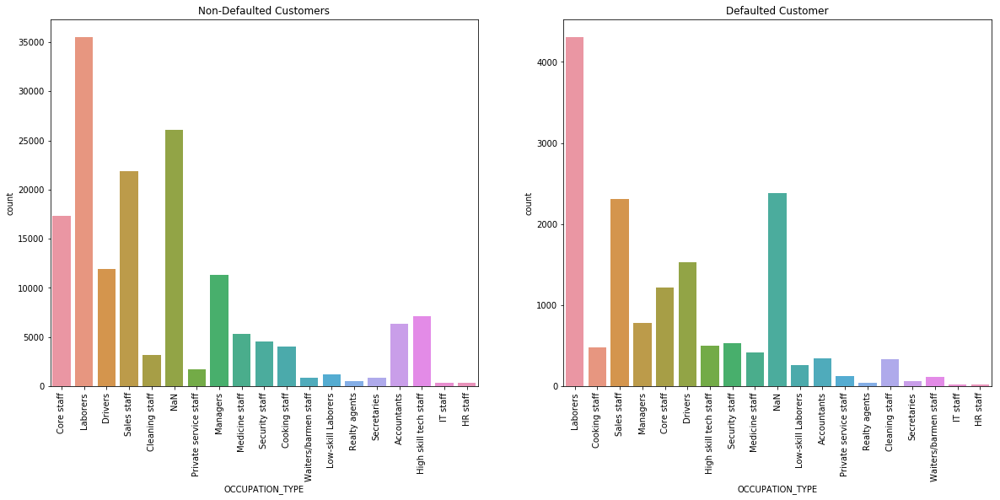

In [148]:
# Occupation type and their distribution
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.countplot(application_0['OCCUPATION_TYPE'])
plt.title('Non-Defaulted Customers')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.countplot(application_1['OCCUPATION_TYPE'])
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

## Inference: Core-staffs , Sales-staff ,Accountants, High skilled tech staff and Managers tend to default less.


<font size=4px color=blue>Numerical Univariate Analysis</font>

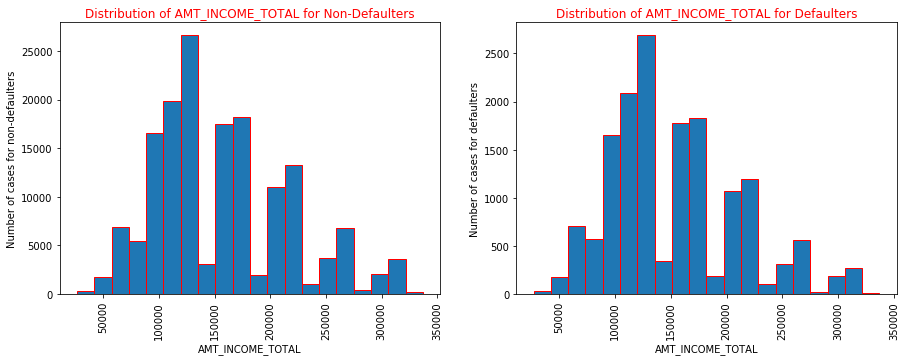

In [149]:
## AMT_INCOME_TOTAL and its distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(application_0["AMT_INCOME_TOTAL"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_INCOME_TOTAL for Non-Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_INCOME_TOTAL")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(application_1["AMT_INCOME_TOTAL"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_INCOME_TOTAL for Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_INCOME_TOTAL")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People having Income range greater than 2lakhs tends to default less.


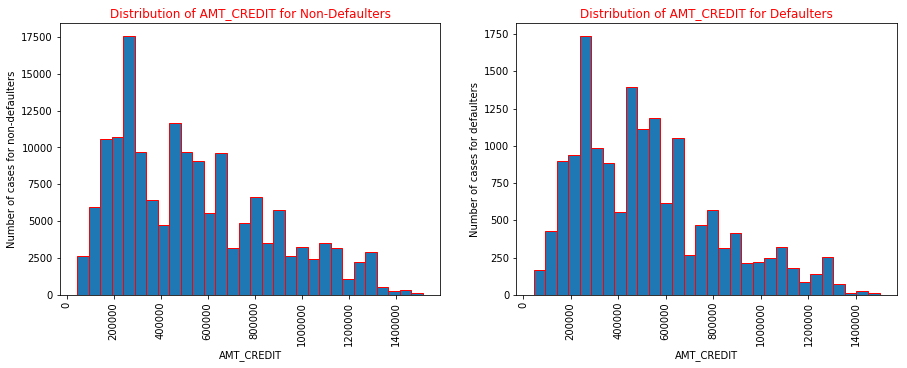

In [150]:
## AMT_CREDIT and its distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(application_0["AMT_CREDIT"],bins = 30,edgecolor='#FF0000')
plt.title("Distribution of AMT_CREDIT for Non-Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(application_1["AMT_CREDIT"],bins = 30,edgecolor='#FF0000')
plt.title("Distribution of AMT_CREDIT for Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_CREDIT")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People with Credit Range 8lakhs-12lakhs tends to Default less.


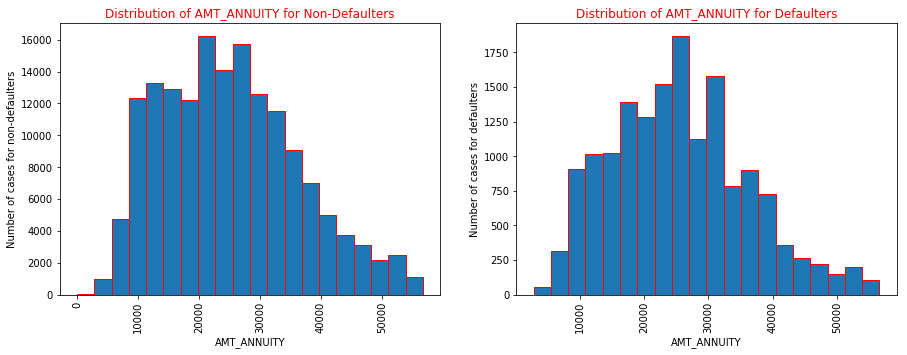

In [151]:
## AMT_ANNUITY and its distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(application_0["AMT_ANNUITY"], bins=20,edgecolor='#FF0000')
plt.title("Distribution of AMT_ANNUITY for Non-Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_ANNUITY")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(application_1["AMT_ANNUITY"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_ANNUITY for Defaulters", fontsize = 12,color="r")
plt.xlabel("AMT_ANNUITY")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People paid annuity more than 30000 tends to Default less.


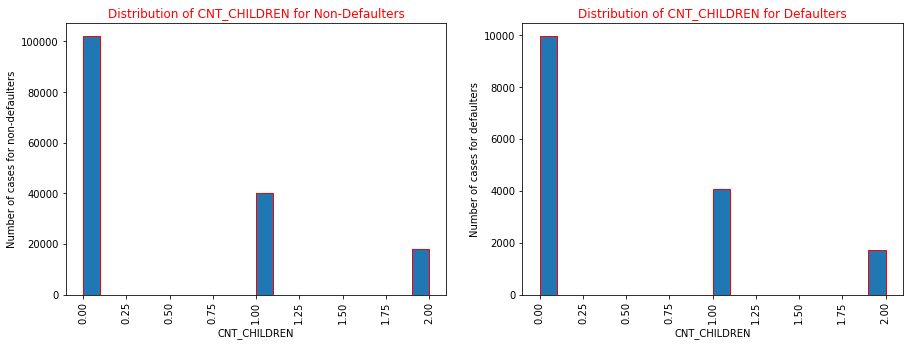

In [152]:
## CNT_CHILDREN and its distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(application_0["CNT_CHILDREN"],bins=20,edgecolor='#FF0000')
plt.title("Distribution of CNT_CHILDREN for Non-Defaulters", fontsize = 12,color="r")
plt.xlabel("CNT_CHILDREN")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(application_1["CNT_CHILDREN"],bins=20,edgecolor='#FF0000')
plt.title("Distribution of CNT_CHILDREN for Defaulters", fontsize = 12,color="r")
plt.xlabel("CNT_CHILDREN")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

<font size=4px color=blue>#Bivariate Ananlysis</font>

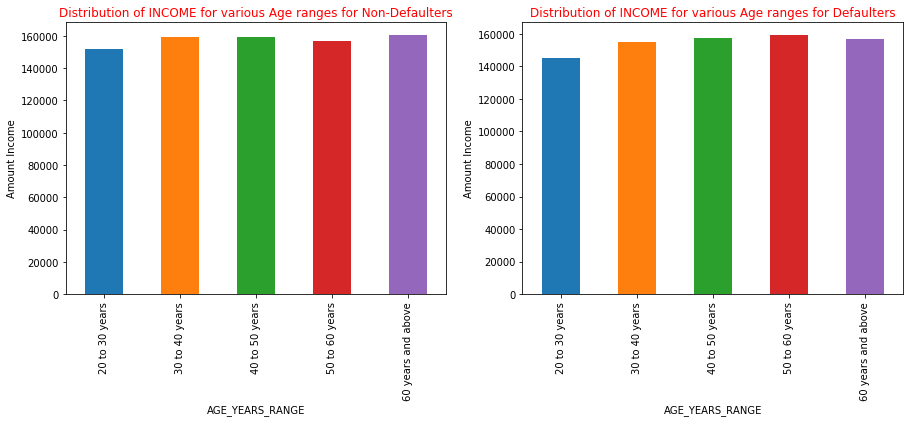

In [153]:
# Income range vs Age
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
application_0.groupby("AGE_YEARS_RANGE")["AMT_INCOME_TOTAL"].mean().plot.bar()
plt.title("Distribution of INCOME for various Age ranges for Non-Defaulters", fontsize = 12,color="r")
plt.ylabel('Amount Income')
plt.subplot(1,2,2)
application_1.groupby("AGE_YEARS_RANGE")["AMT_INCOME_TOTAL"].mean().plot.bar()
plt.title("Distribution of INCOME for various Age ranges for Defaulters", fontsize = 12,color="r")
plt.ylabel('Amount Income')
plt.show()

## Inference: People having Age 50-60 years and Income range 14-16 lakhs tends to default more.


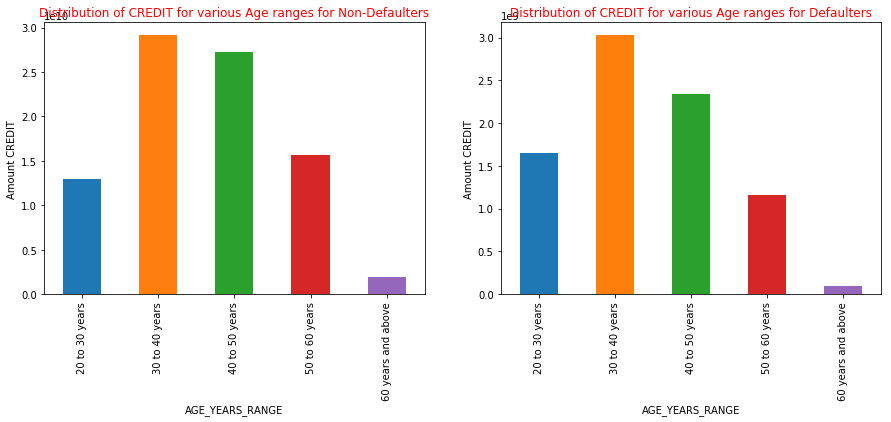

In [154]:
# Amount Credit vs Age
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
application_0.groupby("AGE_YEARS_RANGE")["AMT_CREDIT"].sum().plot.bar()
plt.title("Distribution of CREDIT for various Age ranges for Non-Defaulters", fontsize = 12,color="r")
plt.ylabel('Amount CREDIT')
plt.subplot(1,2,2)
application_1.groupby("AGE_YEARS_RANGE")["AMT_CREDIT"].sum().plot.bar()
plt.title("Distribution of CREDIT for various Age ranges for Defaulters", fontsize = 12,color="r")
plt.ylabel('Amount CREDIT')
plt.show()

## Inference: People having Age 40-50 years are credited with total sum of around 2750 crores and Age 50-60 years are credited with total sum of around 1600 crores  tends to default less

In [155]:
application_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160458 entries, 1 to 307510
Data columns (total 81 columns):
SK_ID_CURR                     160458 non-null int64
TARGET                         160458 non-null int64
NAME_CONTRACT_TYPE             160458 non-null object
CODE_GENDER                    160458 non-null object
FLAG_OWN_CAR                   160458 non-null object
FLAG_OWN_REALTY                160458 non-null object
CNT_CHILDREN                   160458 non-null int64
AMT_INCOME_TOTAL               160458 non-null float64
AMT_CREDIT                     160458 non-null float64
AMT_ANNUITY                    160458 non-null float64
AMT_GOODS_PRICE                160458 non-null float64
NAME_TYPE_SUITE                160458 non-null object
NAME_INCOME_TYPE               160458 non-null object
NAME_EDUCATION_TYPE            160458 non-null object
NAME_FAMILY_STATUS             160458 non-null object
NAME_HOUSING_TYPE              160458 non-null object
REGION_POPULATION_RELATI

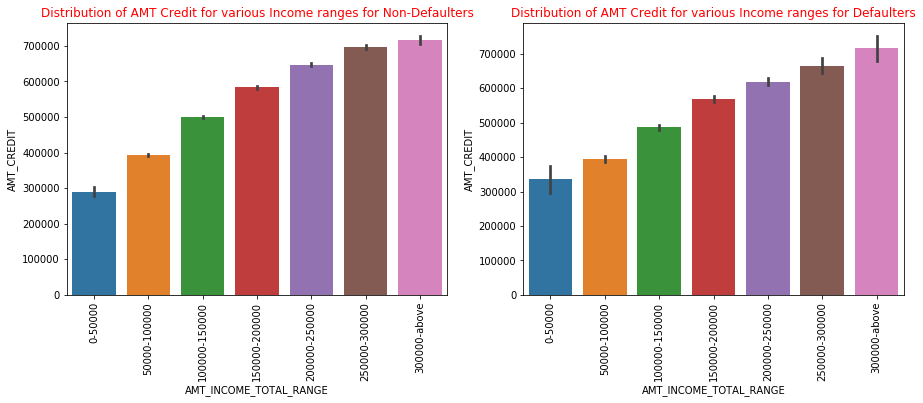

In [156]:
# Amount Income Range vs Amt Credit
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(data = application_0, x = "AMT_INCOME_TOTAL_RANGE",y= "AMT_CREDIT",estimator=np.mean)
plt.xticks(rotation=90)
plt.title("Distribution of AMT Credit for various Income ranges for Non-Defaulters", fontsize = 12,color="r")
plt.subplot(1,2,2)
sns.barplot(data = application_1, x = "AMT_INCOME_TOTAL_RANGE",y= "AMT_CREDIT",estimator=np.mean)
plt.xticks(rotation=90)
plt.title("Distribution of AMT Credit for various Income ranges for Defaulters", fontsize = 12,color="r")
plt.show()

In [157]:
## Inference: People with Income range 0-50000 and credited with more than 3lakhs tends to default more.

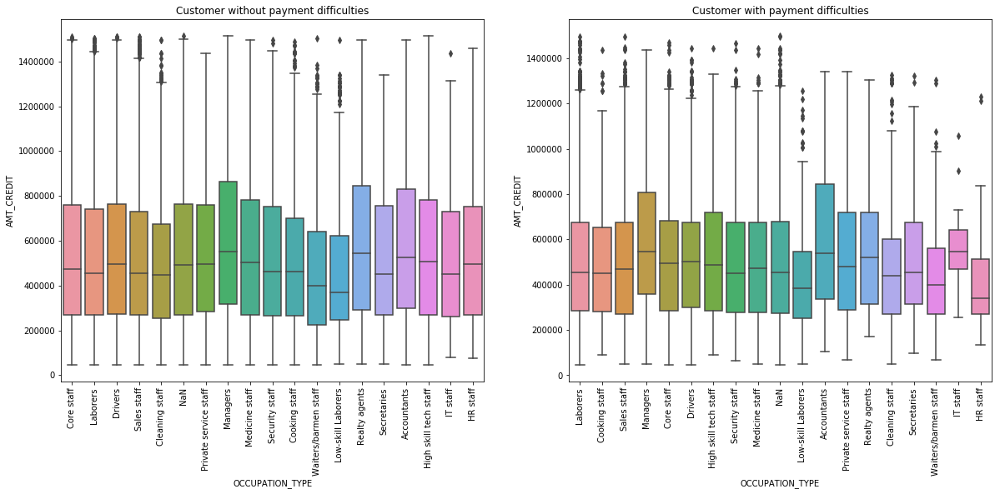

In [158]:
## Occupation Type vs Amt Credit
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=application_0,y='AMT_CREDIT',x='OCCUPATION_TYPE')
plt.title('Customer without payment difficulties')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=application_1,y='AMT_CREDIT',x='OCCUPATION_TYPE')
plt.title('Customer with payment difficulties')
plt.xticks(rotation=90)
plt.show()

## Inference1: Realty Agents takes more credit defaults less.

## Inference2: The IQR of IT staff and HR staff is less for defaulters.


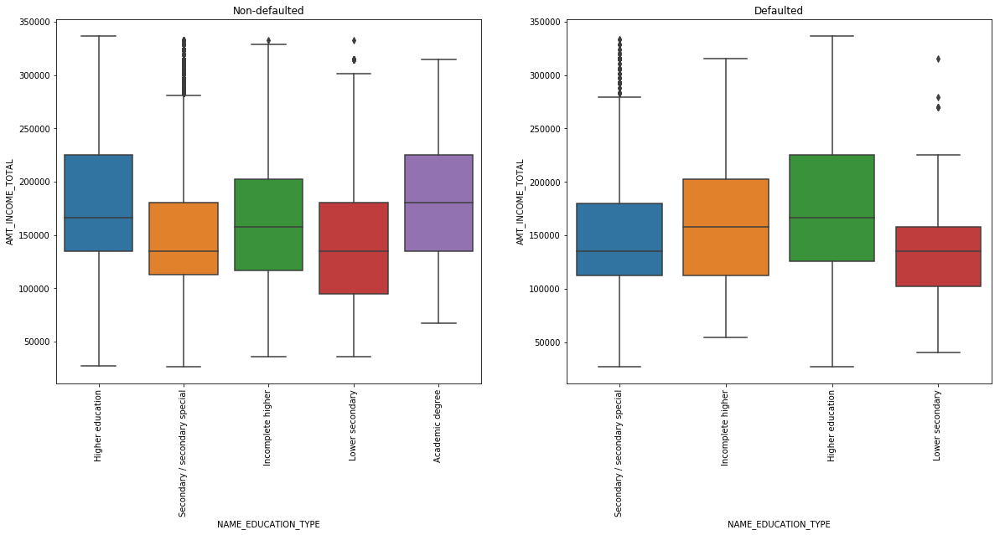

In [159]:
## Education type vs Amt Income Total
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=application_0,y='AMT_INCOME_TOTAL',x='NAME_EDUCATION_TYPE')
plt.title('Non-defaulted')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=application_1,y='AMT_INCOME_TOTAL',x='NAME_EDUCATION_TYPE')
plt.title('Defaulted')
plt.xticks(rotation=90)
plt.show()

## Inference: People having Academic degree are Non-defaulters.


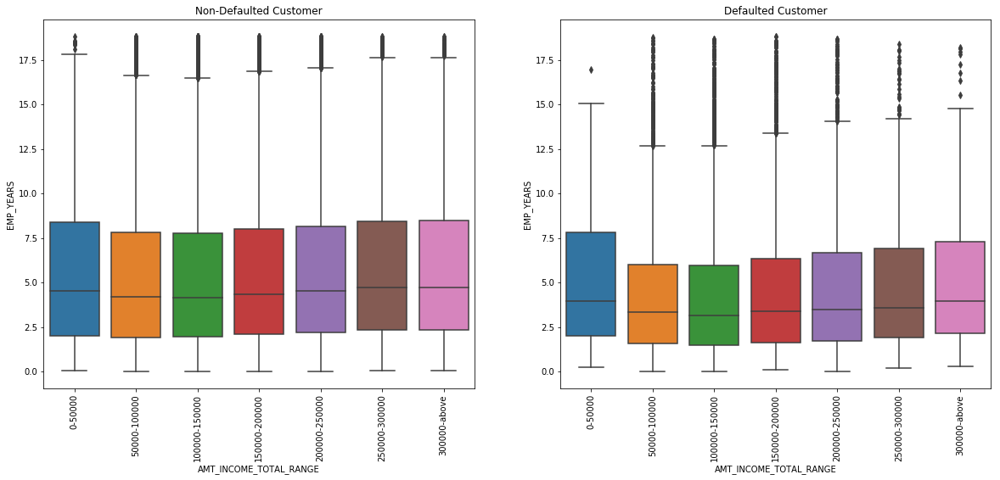

In [160]:
#INCOME RANGE vs Employment years
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=application_0,y='EMP_YEARS',x='AMT_INCOME_TOTAL_RANGE')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=application_1,y='EMP_YEARS',x='AMT_INCOME_TOTAL_RANGE')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

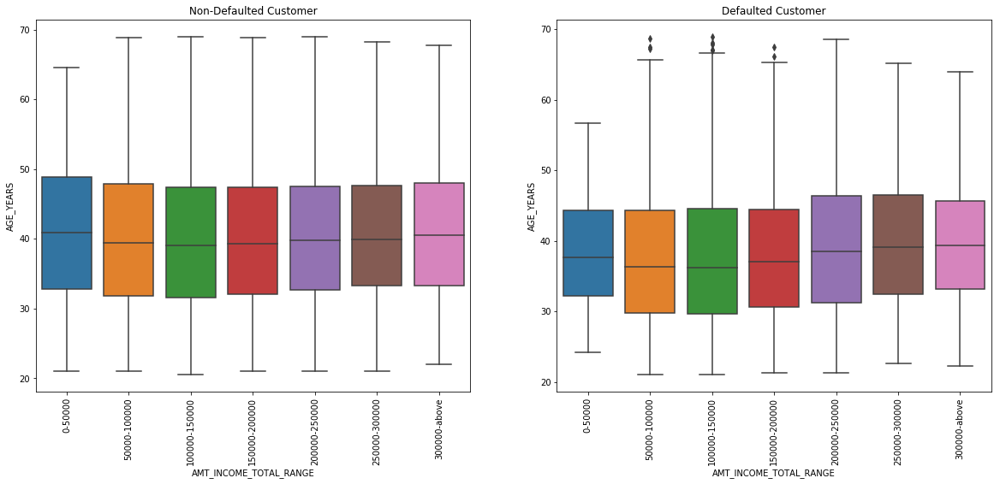

In [161]:
#INCOME RANGE vs AGE years  
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=application_0,y='AGE_YEARS',x='AMT_INCOME_TOTAL_RANGE')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=application_1,y='AGE_YEARS',x='AMT_INCOME_TOTAL_RANGE')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

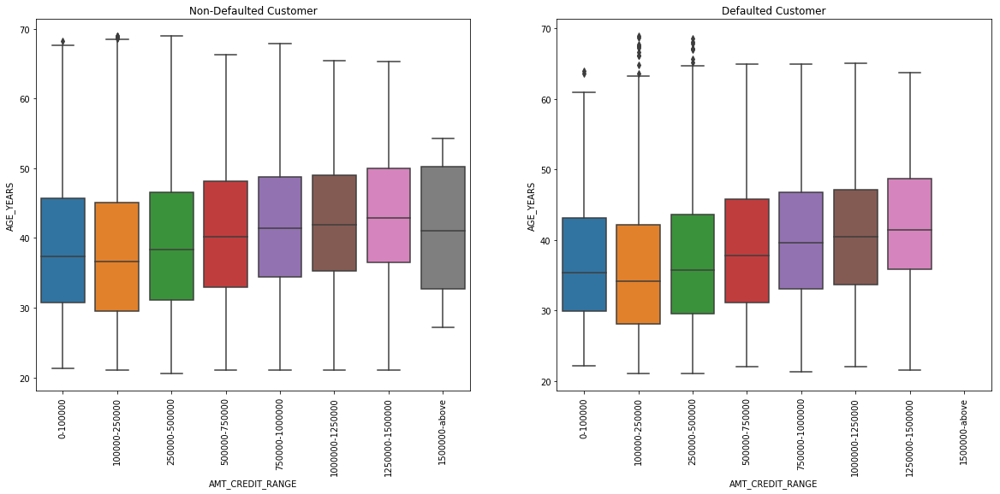

In [162]:
#CREDIT_RANGE vs AGE years
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=application_0,y='AGE_YEARS',x='AMT_CREDIT_RANGE')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=application_1,y='AGE_YEARS',x='AMT_CREDIT_RANGE')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

## Inference: People having less years of employment experience tend to default more.


#### Creating pair-plots fot Target 0 and Target 1

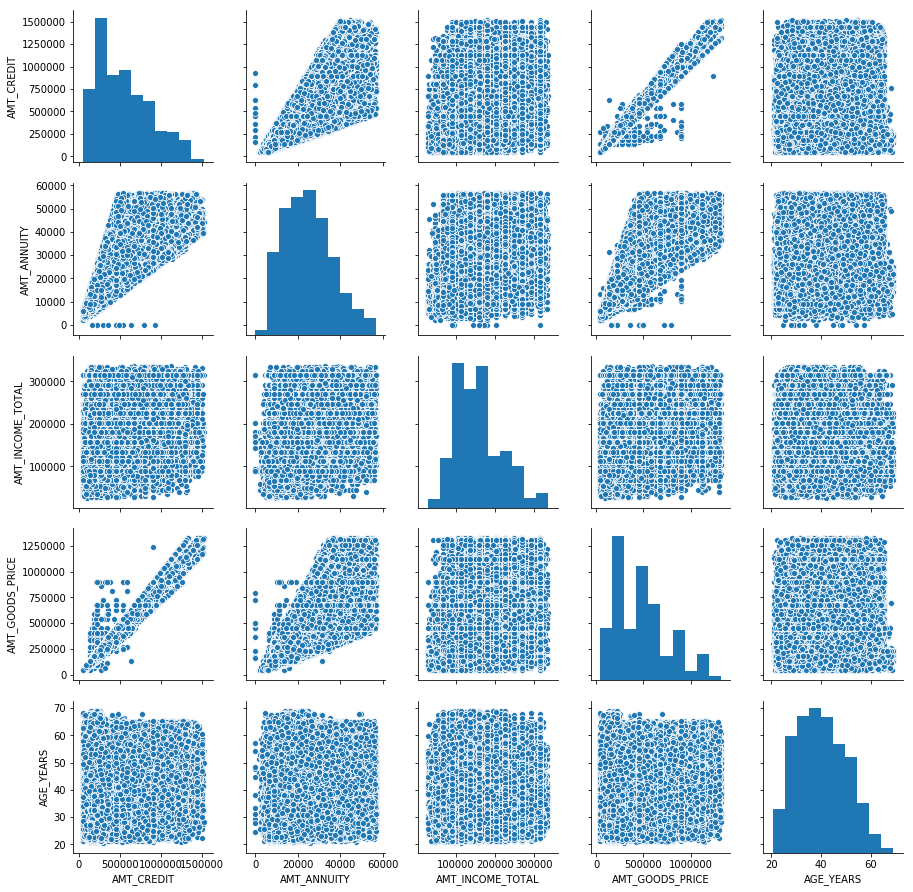

In [163]:
#Pairplot for Target 0 (Non-Defaulters)
pair = application_0[['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 'AGE_YEARS']].fillna(0)
sns.pairplot(pair)

plt.show()

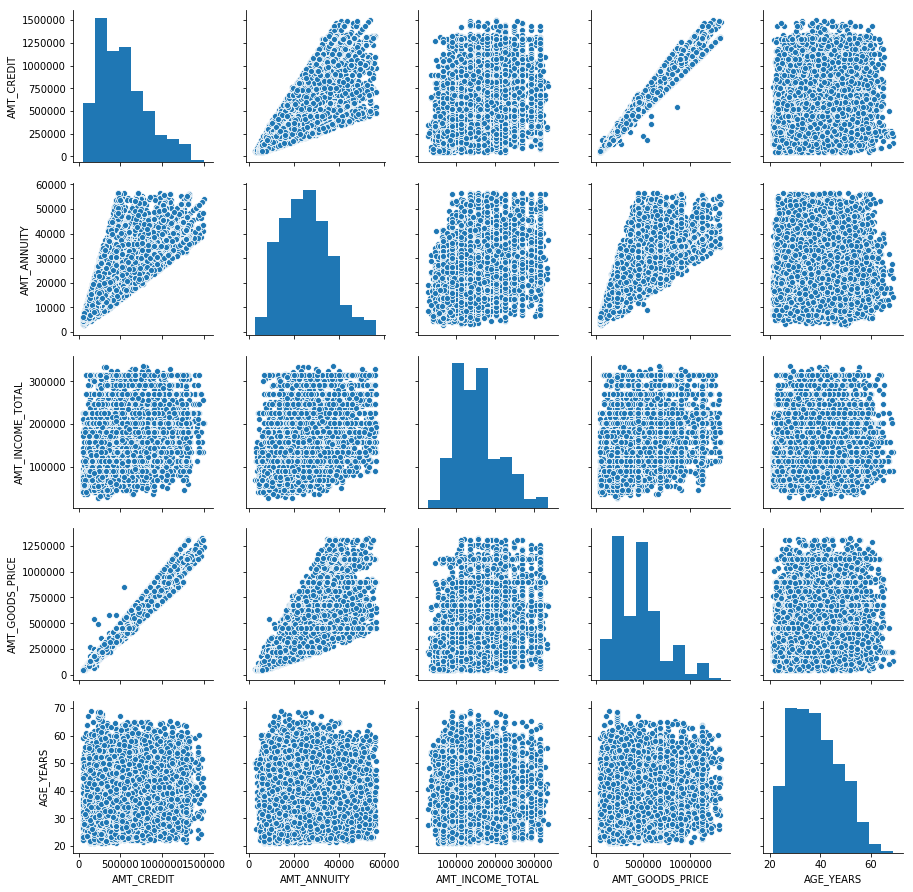

In [164]:
#Pairplot for Target 1 (Defaulters)
pair = application_1[['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 'AGE_YEARS']].fillna(0)
sns.pairplot(pair)

plt.show()

## Multivariate Analysis

In [165]:
res = pd.pivot_table(data = application_0, index = "AMT_INCOME_TOTAL_RANGE",columns="AGE_YEARS_RANGE",values = "AMT_ANNUITY",aggfunc=np.mean)
res

AGE_YEARS_RANGE,20 to 30 years,30 to 40 years,40 to 50 years,50 to 60 years,60 years and above
AMT_INCOME_TOTAL_RANGE,,,,,
0-50000,13859.812500,14482.653061,14471.396907,13213.107422,13010.000000
50000-100000,16732.150477,18569.373200,19257.713984,19065.411722,18347.976834
100000-150000,21108.586671,23167.290252,24097.508077,24092.451402,23467.039683
150000-200000,25343.733150,26751.929465,27524.046782,27450.342279,27224.747868
200000-250000,28209.886002,29661.512417,30218.965043,30407.945425,29598.240291
250000-300000,30350.608508,31242.277604,32151.367143,32613.594220,33415.269231
300000-above,31618.574570,33014.187640,34015.976513,33507.138360,32713.760870


In [166]:
res1 = pd.pivot_table(data = application_1, index = "AMT_INCOME_TOTAL_RANGE",columns="AGE_YEARS_RANGE",values = "AMT_ANNUITY",aggfunc=np.mean)
res1

AGE_YEARS_RANGE,20 to 30 years,30 to 40 years,40 to 50 years,50 to 60 years,60 years and above
AMT_INCOME_TOTAL_RANGE,,,,,
0-50000,15158.357143,15557.670000,17608.821429,14956.031250,NaN
50000-100000,17925.424222,19884.265217,20419.795862,19021.585174,18552.681818
100000-150000,22268.920280,24285.604277,24502.296729,24642.718605,23393.094828
150000-200000,26795.270833,27290.758966,28165.052217,28143.830296,27356.307692
200000-250000,29070.086042,29831.729012,29588.462500,29755.348894,26425.440000
250000-300000,31818.209016,31645.164038,32343.116327,32332.273109,32411.500000
300000-above,33162.500000,34635.112500,33246.284211,30467.057143,22603.500000


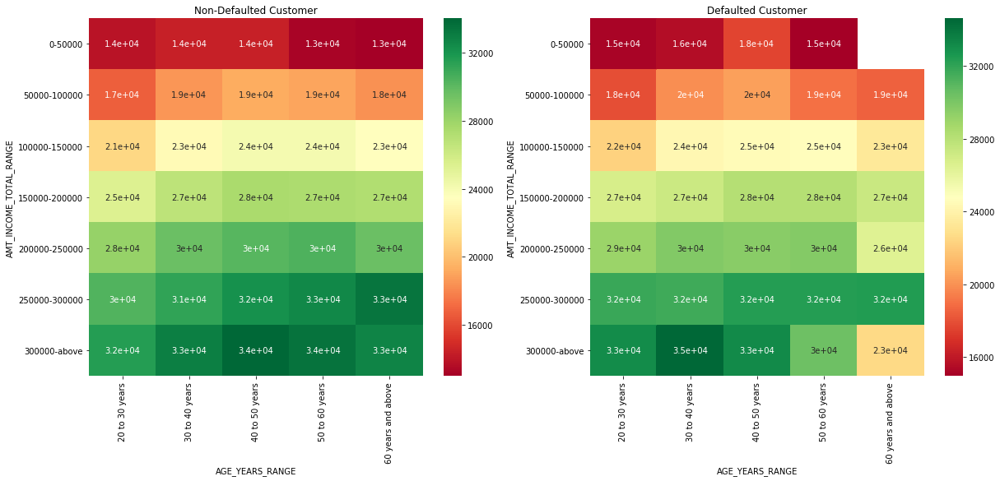

In [167]:
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
plt.title("Non-Defaulted Customer")
sns.heatmap(res,cmap = "RdYlGn",annot = True)
plt.subplot(1,2,2)
plt.title("Defaulted Customer")
sns.heatmap(res1,cmap = "RdYlGn",annot = True)

In [168]:
res3 = pd.pivot_table(data = application_0, index = "AMT_INCOME_TOTAL_RANGE",columns="NAME_EDUCATION_TYPE",values = "AMT_CREDIT",aggfunc=np.mean)
res3

NAME_EDUCATION_TYPE,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special
AMT_INCOME_TOTAL_RANGE,,,,,
0-50000,NaN,322945.725664,304702.071429,265897.887097,286777.601483
50000-100000,6.035966e+05,386841.127458,355451.078981,390611.607242,394904.067492
100000-150000,4.595326e+05,494166.493836,432170.726802,505544.094512,505687.839503
150000-200000,5.318667e+05,579026.674078,529616.787461,586304.576655,588008.376466
200000-250000,5.948591e+05,645217.515209,609573.793017,621061.171875,651527.802139
250000-300000,6.713801e+05,696149.351876,640800.473684,651027.681818,701754.007944
300000-above,1.106697e+06,714533.904803,722869.255618,718102.894737,717452.527676


In [169]:
res4 = pd.pivot_table(data = application_1, index = "AMT_INCOME_TOTAL_RANGE",columns="NAME_EDUCATION_TYPE",values = "AMT_CREDIT",aggfunc=np.mean)
res4

NAME_EDUCATION_TYPE,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special
AMT_INCOME_TOTAL_RANGE,,,,
0-50000,309024.000000,NaN,339156.000000,338013.137755
50000-100000,409483.255102,356961.987342,380036.294118,394300.047639
100000-150000,495888.028058,418692.623077,479908.738636,488025.990769
150000-200000,567991.317236,568665.754658,509481.315789,571677.337963
200000-250000,632105.594388,617751.208333,520489.350000,616548.327632
250000-300000,709613.042986,685803.477273,693388.800000,646658.385609
300000-above,708809.388889,763272.750000,612612.000000,715804.595238


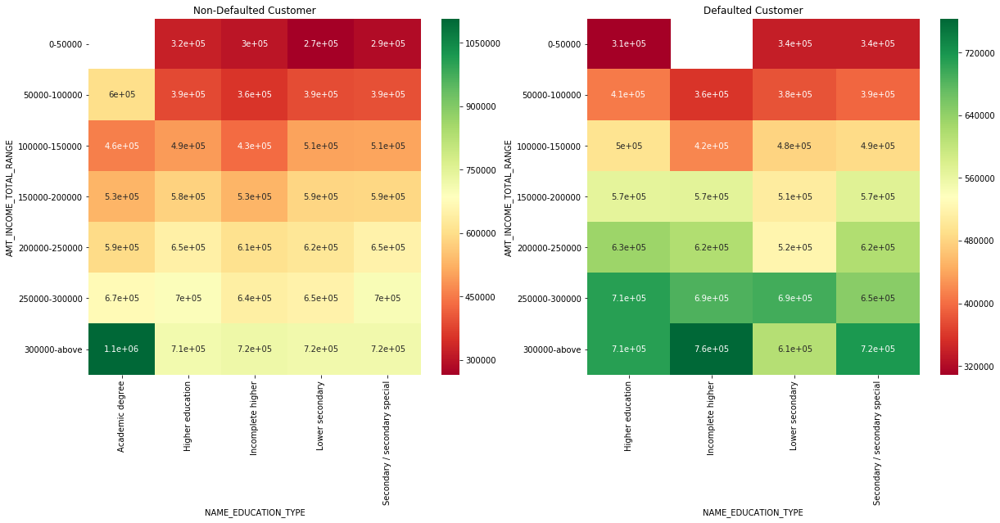

In [170]:
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
plt.title("Non-Defaulted Customer")
sns.heatmap(res3,cmap = "RdYlGn",annot = True)
plt.subplot(1,2,2)
plt.title("Defaulted Customer")
sns.heatmap(res4,cmap = "RdYlGn",annot = True)

In [171]:
res5 = pd.pivot_table(data = application_0, index = "AMT_INCOME_TOTAL_RANGE",columns="OCCUPATION_TYPE",values = "AMT_ANNUITY",aggfunc=np.mean)
res5

OCCUPATION_TYPE,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,NaN,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff
AMT_INCOME_TOTAL_RANGE,,,,,,,,,,,,,,,,,,,
0-50000,15997.500000,13234.623853,13512.717391,15338.932258,16337.437500,11668.500000,15739.682927,NaN,13586.934066,13470.500000,14066.785714,14994.576923,13549.651261,8345.250000,NaN,14124.461538,18199.500000,13594.250000,13704.750000
50000-100000,18887.751276,17958.100000,18909.645147,18292.769712,18572.950151,18947.524390,18736.406780,15420.886364,18172.698706,17624.014925,19924.634694,18757.041485,18583.993931,18993.980769,18922.125000,18656.305427,19298.162621,18346.918605,17233.753247
100000-150000,23978.663594,22356.424682,23576.663308,22821.341589,23254.701973,22617.381356,23201.687730,22030.432584,22797.614965,22285.932632,24003.241892,23330.170442,23183.243387,23914.494755,23564.537594,23586.960674,22938.558824,23112.236111,22974.820312
150000-200000,27815.366310,25367.679368,27747.840726,26567.632540,27149.330707,26501.062500,26469.944695,23693.042169,26422.335797,26652.494118,27258.434672,26993.258443,26945.646351,28362.208134,29659.466418,27094.005221,27216.917763,26244.882261,26195.509091
200000-250000,30971.954717,28728.197492,30737.692389,28977.306925,30146.976182,26507.316176,29914.738562,28440.914062,29397.654235,30118.968000,30583.266741,29462.026462,29631.411619,29998.810056,30514.221239,29575.069610,30065.594595,28682.826121,28300.420354
250000-300000,32893.111531,33045.051724,32738.492126,31104.247348,32481.804728,32387.000000,31146.420949,32006.368421,31217.038149,35994.375000,32443.621059,31514.338235,31433.757312,32666.435644,32515.946809,30927.828851,29846.250000,29358.737288,33324.500000
300000-above,34049.100000,32534.307692,32843.520000,32960.521357,32999.197011,32576.625000,33227.889706,27203.625000,32332.267367,26079.545455,34397.002410,34135.650000,33349.022727,32914.147059,35167.178571,32557.986063,38665.800000,29131.132075,30651.300000


In [172]:
res6 = pd.pivot_table(data = application_1, index = "AMT_INCOME_TOTAL_RANGE",columns="OCCUPATION_TYPE",values = "AMT_ANNUITY",aggfunc=np.mean)
res6

OCCUPATION_TYPE,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,NaN,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff
AMT_INCOME_TOTAL_RANGE,,,,,,,,,,,,,,,,,,,
0-50000,NaN,12871.350000,20069.590909,19218.115385,10611.000000,NaN,NaN,NaN,16796.117647,9996.750000,18064.500000,13947.000000,14275.125000,NaN,NaN,14048.590909,21890.250000,15879.807692,21906.000000
50000-100000,20218.500000,18690.024194,19021.079137,19125.525000,20142.466667,15336.0,18593.788235,21513.0,19311.076308,17975.160000,19560.970588,21060.409091,19453.666667,17465.558824,24052.500000,19900.325516,17656.500000,18628.476378,18052.714286
100000-150000,25036.013514,23473.916667,24094.030726,23900.714109,24669.970402,24579.0,24760.624260,21510.0,23454.641104,22605.514286,26071.301887,24163.946809,22913.781288,26145.658537,23674.764706,23953.760638,27899.689655,24058.554124,22194.661765
150000-200000,27743.531250,26015.602041,28105.220930,27560.515152,27501.620469,19025.1,26635.769231,24706.0,27588.882511,28031.911765,28595.000000,26457.166667,27316.038462,27381.136364,27887.500000,27592.354086,21400.714286,28453.500000,26979.362069
200000-250000,31190.335714,24950.918919,28433.942308,29539.179144,30394.572816,28086.3,29731.853933,39411.0,29803.628049,23261.062500,30376.687500,28435.166667,29491.464200,27948.717391,31846.500000,28820.108911,22126.500000,29168.142857,27869.464286
250000-300000,37138.050000,30201.187500,29502.409091,32740.500000,31321.113861,37818.0,29898.364865,NaN,31931.611364,28335.500000,33328.200000,26620.500000,31377.214286,32919.428571,33030.000000,32840.601266,33673.500000,33597.214286,29568.750000
300000-above,31211.000000,20945.250000,26797.500000,34906.500000,37338.346154,52114.5,37878.428571,38322.0,32999.142857,25537.500000,32833.500000,27940.500000,33078.700000,29905.500000,25665.750000,31377.053571,31153.500000,27961.200000,40617.000000


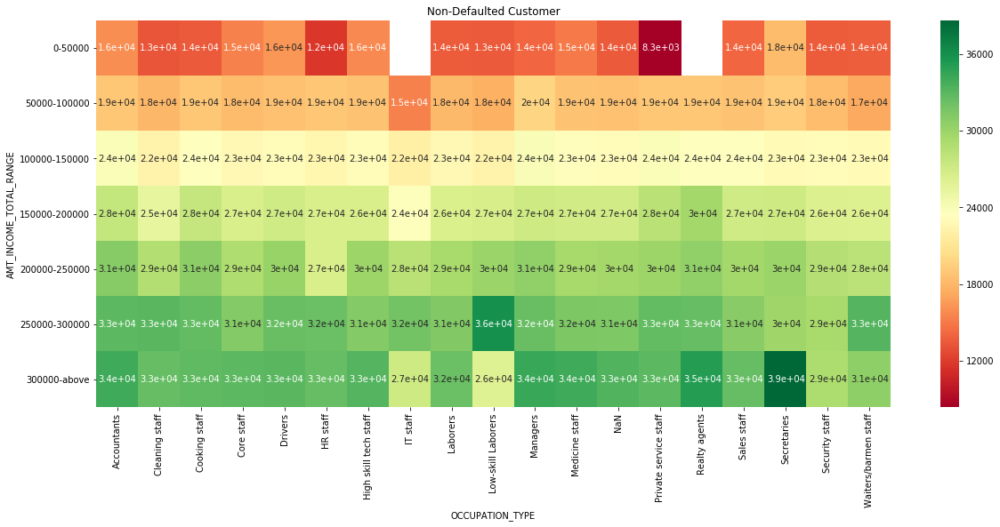

In [173]:
plt.figure(figsize=(20,8)) 
plt.title("Non-Defaulted Customer")
sns.heatmap(res5,cmap = "RdYlGn",annot = True)


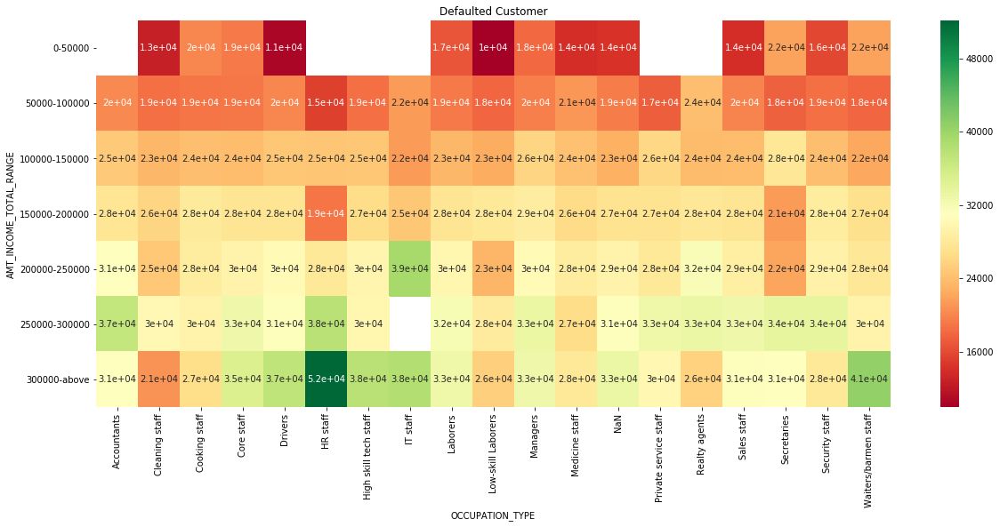

In [174]:
plt.figure(figsize=(20,8)) 
plt.title("Defaulted Customer")
sns.heatmap(res6,cmap = "RdYlGn",annot = True)

In [175]:
#selecting columns for correlation

cols=[ 'EXT_SOURCE_2',
       'AMT_GOODS_PRICE', 'AMT_ANNUITY', 'CNT_FAM_MEMBERS',
        'AMT_CREDIT', 'AMT_INCOME_TOTAL',
       'DAYS_REGISTRATION', 'REGION_POPULATION_RELATIVE','CNT_CHILDREN',
       'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT','AGE_YEARS'
       , 'EMP_YEARS']

In [176]:
Non_defaulters=application_0[cols]
Non_defaulters_correlation = Non_defaulters.corr()
round(Non_defaulters_correlation, 3)

,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,AMT_CREDIT,AMT_INCOME_TOTAL,DAYS_REGISTRATION,REGION_POPULATION_RELATIVE,CNT_CHILDREN,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,AGE_YEARS,EMP_YEARS
EXT_SOURCE_2,1.000,0.099,0.081,-0.002,0.091,0.132,-0.068,0.184,-0.017,-0.269,-0.274,0.131,0.079
AMT_GOODS_PRICE,0.099,1.000,0.752,0.036,0.981,0.307,-0.022,0.053,-0.023,-0.056,-0.052,0.145,0.080
AMT_ANNUITY,0.081,0.752,1.000,0.044,0.753,0.384,0.003,0.063,-0.008,-0.090,-0.079,0.081,0.049
CNT_FAM_MEMBERS,-0.002,0.036,0.044,1.000,0.037,-0.023,0.149,-0.027,0.875,0.042,0.041,-0.178,0.029
AMT_CREDIT,0.091,0.981,0.753,0.037,1.000,0.304,-0.025,0.048,-0.019,-0.056,-0.051,0.150,0.077
AMT_INCOME_TOTAL,0.132,0.307,0.384,-0.023,0.304,1.000,0.037,0.138,-0.024,-0.195,-0.177,0.026,0.035
DAYS_REGISTRATION,-0.068,-0.022,0.003,0.149,-0.025,0.037,1.000,-0.055,0.155,0.090,0.097,-0.279,-0.101
REGION_POPULATION_RELATIVE,0.184,0.053,0.063,-0.027,0.048,0.138,-0.055,1.000,-0.027,-0.494,-0.496,0.037,-0.000
CNT_CHILDREN,-0.017,-0.023,-0.008,0.875,-0.019,-0.024,0.155,-0.027,1.000,0.036,0.036,-0.250,-0.005
REGION_RATING_CLIENT_W_CITY,-0.269,-0.056,-0.090,0.042,-0.056,-0.195,0.090,-0.494,0.036,1.000,0.950,-0.031,0.012


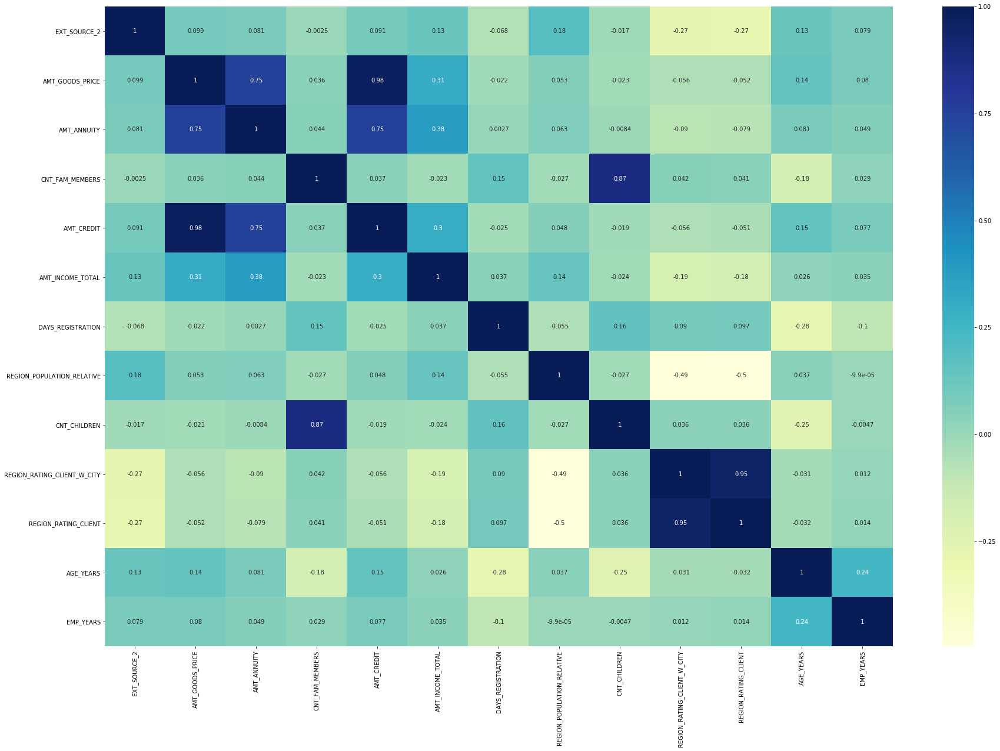

In [177]:
# figure size
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(Non_defaulters_correlation, cmap="YlGnBu", annot=True)
plt.show()

In [178]:
defaulters=application_1[cols]
defaulters_correlation = defaulters.corr()
round(defaulters_correlation, 3)

,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,AMT_CREDIT,AMT_INCOME_TOTAL,DAYS_REGISTRATION,REGION_POPULATION_RELATIVE,CNT_CHILDREN,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,AGE_YEARS,EMP_YEARS
EXT_SOURCE_2,1.000,0.096,0.075,0.007,0.085,0.114,-0.070,0.162,-0.005,-0.242,-0.242,0.127,0.079
AMT_GOODS_PRICE,0.096,1.000,0.738,0.057,0.977,0.302,-0.025,0.067,-0.001,-0.057,-0.050,0.170,0.112
AMT_ANNUITY,0.075,0.738,1.000,0.070,0.739,0.373,0.022,0.049,0.024,-0.056,-0.044,0.077,0.064
CNT_FAM_MEMBERS,0.007,0.057,0.070,1.000,0.058,-0.031,0.120,-0.024,0.870,0.040,0.036,-0.122,0.039
AMT_CREDIT,0.085,0.977,0.739,0.058,1.000,0.299,-0.026,0.058,0.005,-0.051,-0.042,0.176,0.104
AMT_INCOME_TOTAL,0.114,0.302,0.373,-0.031,0.299,1.000,0.004,0.080,-0.034,-0.154,-0.142,0.081,0.042
DAYS_REGISTRATION,-0.070,-0.025,0.022,0.120,-0.026,0.004,1.000,-0.056,0.119,0.112,0.115,-0.221,-0.075
REGION_POPULATION_RELATIVE,0.162,0.067,0.049,-0.024,0.058,0.080,-0.056,1.000,-0.028,-0.413,-0.408,0.051,0.020
CNT_CHILDREN,-0.005,-0.001,0.024,0.870,0.005,-0.034,0.119,-0.028,1.000,0.040,0.038,-0.192,0.004
REGION_RATING_CLIENT_W_CITY,-0.242,-0.057,-0.056,0.040,-0.051,-0.154,0.112,-0.413,0.040,1.000,0.960,-0.043,-0.002


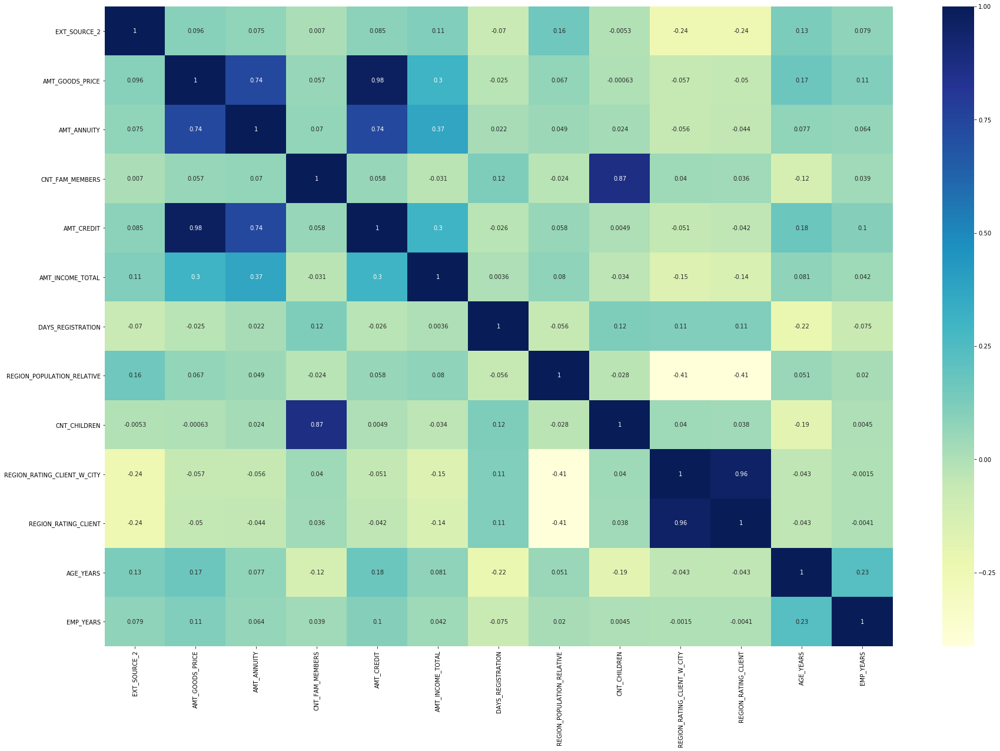

In [179]:
# figure size
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(defaulters_correlation, cmap="YlGnBu", annot=True)
plt.show()

## Inference: We observe that there is a high correlation between credit amount and goods price. There appears to be some deviancies in the correlation of Loan-Payment Difficulties and Loan- Non Payment Difficulties such as credit amount v/s income

<font size=4px color=blue> Merging Previous Application Data to Application data</font>

In [180]:
df2.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [181]:
df2.nunique()

SK_ID_PREV                     1670214
SK_ID_CURR                      338857
NAME_CONTRACT_TYPE                   4
AMT_ANNUITY                     357959
AMT_APPLICATION                  93885
AMT_CREDIT                       86803
AMT_DOWN_PAYMENT                 29278
AMT_GOODS_PRICE                  93885
WEEKDAY_APPR_PROCESS_START           7
HOUR_APPR_PROCESS_START             24
FLAG_LAST_APPL_PER_CONTRACT          2
NFLAG_LAST_APPL_IN_DAY               2
RATE_DOWN_PAYMENT               207033
RATE_INTEREST_PRIMARY              148
RATE_INTEREST_PRIVILEGED            25
NAME_CASH_LOAN_PURPOSE              25
NAME_CONTRACT_STATUS                 4
DAYS_DECISION                     2922
NAME_PAYMENT_TYPE                    4
CODE_REJECT_REASON                   9
NAME_TYPE_SUITE                      7
NAME_CLIENT_TYPE                     4
NAME_GOODS_CATEGORY                 28
NAME_PORTFOLIO                       5
NAME_PRODUCT_TYPE                    3
CHANNEL_TYPE             

In [182]:
prev_application = df2.drop_duplicates(subset='SK_ID_CURR', keep='first')
prev_application.head()


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [183]:
prev_application["SK_ID_CURR"].nunique()

338857

In [184]:
prev_application.shape

(338857, 37)

### Creating a merged dataset called all_application for the combined merged data of application dataset and prev_application dataset

In [185]:
all_application = application.merge(prev_application, on = "SK_ID_CURR", how = "inner")
all_application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99,5.81,250000-500000,250000-500000,200000-250000,20000-30000,20 to 30 years,1038818,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25,3.25,0.80,1250000-1500000,1000000-1250000,250000-300000,30000-40000,40 to 50 years,1810518,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67,6.93,100000-250000,100000-250000,50000-100000,0-10000,50 to 60 years,1564014,Con

In [186]:
all_application.shape

(168088, 117)

In [187]:
all_application.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168088 entries, 0 to 168087
Columns: 117 entries, SK_ID_CURR to NFLAG_INSURED_ON_APPROVAL
dtypes: category(5), float64(38), int64(46), object(28)
memory usage: 145.7+ MB


In [188]:
all_application.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE_x                 0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT_x                         0
AMT_ANNUITY_x                        0
AMT_GOODS_PRICE_x                    0
NAME_TYPE_SUITE_x                    0
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE                     0
FLAG_PHONE               

In [189]:
### calculating the %ge of total null values from the entire dataset.
(all_application.isnull().sum()*100/len(all_application)).round(2)

SK_ID_CURR                       0.00
TARGET                           0.00
NAME_CONTRACT_TYPE_x             0.00
CODE_GENDER                      0.00
FLAG_OWN_CAR                     0.00
FLAG_OWN_REALTY                  0.00
CNT_CHILDREN                     0.00
AMT_INCOME_TOTAL                 0.00
AMT_CREDIT_x                     0.00
AMT_ANNUITY_x                    0.00
AMT_GOODS_PRICE_x                0.00
NAME_TYPE_SUITE_x                0.00
NAME_INCOME_TYPE                 0.00
NAME_EDUCATION_TYPE              0.00
NAME_FAMILY_STATUS               0.00
NAME_HOUSING_TYPE                0.00
REGION_POPULATION_RELATIVE       0.00
DAYS_BIRTH                       0.00
DAYS_EMPLOYED                    0.00
DAYS_REGISTRATION                0.00
DAYS_ID_PUBLISH                  0.00
FLAG_MOBIL                       0.00
FLAG_EMP_PHONE                   0.00
FLAG_WORK_PHONE                  0.00
FLAG_CONT_MOBILE                 0.00
FLAG_PHONE                       0.00
FLAG_EMAIL  

## Dropping the non-relevant columns.
1. I dropped columns with index no. 21, 41 and 43 that includes columns like
- AMT_DOWN_PAYMENT
- RATE_DOWN_PAYMENT
- RATE_INTEREST_PRIMARY
- RATE_INTEREST_PRIVILEGED
- NAME_TYPE_SUITE_y

These columns were deleted because they contained info with nearly 40%, 50% and 99% missing values

In [190]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("AMT_DOWN_PAYMENT") 
print("Index of {} column in given dataframe is : {}".format("AMT_DOWN_PAYMENT", index_no))

Index of AMT_DOWN_PAYMENT column in given dataframe is : 86


In [191]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("RATE_DOWN_PAYMENT") 
print("Index of {} column in given dataframe is : {}".format("RATE_DOWN_PAYMENT", index_no))

Index of RATE_DOWN_PAYMENT column in given dataframe is : 92


In [192]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("RATE_INTEREST_PRIMARY") 
print("Index of {} column in given dataframe is : {}".format("RATE_INTEREST_PRIMARY", index_no))

Index of RATE_INTEREST_PRIMARY column in given dataframe is : 93


In [193]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("RATE_INTEREST_PRIVILEGED") 
print("Index of {} column in given dataframe is : {}".format("RATE_INTEREST_PRIVILEGED", index_no))

Index of RATE_INTEREST_PRIVILEGED column in given dataframe is : 94


In [194]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("NAME_TYPE_SUITE_y") 
print("Index of {} column in given dataframe is : {}".format("NAME_TYPE_SUITE_y", index_no))

Index of NAME_TYPE_SUITE_y column in given dataframe is : 100


In [195]:
### dropping the columns
all_application.drop(all_application.columns[[86,92,93,94,100]], axis = 1, inplace = True) 

In [196]:
### calculating the %ge of total null values from the entire dataset.
(all_application.isnull().sum()*100/len(all_application)).round(2)

SK_ID_CURR                       0.00
TARGET                           0.00
NAME_CONTRACT_TYPE_x             0.00
CODE_GENDER                      0.00
FLAG_OWN_CAR                     0.00
FLAG_OWN_REALTY                  0.00
CNT_CHILDREN                     0.00
AMT_INCOME_TOTAL                 0.00
AMT_CREDIT_x                     0.00
AMT_ANNUITY_x                    0.00
AMT_GOODS_PRICE_x                0.00
NAME_TYPE_SUITE_x                0.00
NAME_INCOME_TYPE                 0.00
NAME_EDUCATION_TYPE              0.00
NAME_FAMILY_STATUS               0.00
NAME_HOUSING_TYPE                0.00
REGION_POPULATION_RELATIVE       0.00
DAYS_BIRTH                       0.00
DAYS_EMPLOYED                    0.00
DAYS_REGISTRATION                0.00
DAYS_ID_PUBLISH                  0.00
FLAG_MOBIL                       0.00
FLAG_EMP_PHONE                   0.00
FLAG_WORK_PHONE                  0.00
FLAG_CONT_MOBILE                 0.00
FLAG_PHONE                       0.00
FLAG_EMAIL  

### inspecting the columns

#### inspecting NAME_CONTRACT_TYPE_y   column

In [197]:
all_application.NAME_CONTRACT_TYPE_y.value_counts()

Consumer loans     101863
Cash loans          48689
Revolving loans     17507
XNA                    29
Name: NAME_CONTRACT_TYPE_y, dtype: int64

In [198]:
### dropping the XNA records from NAME_CONTRACT_TYPE_y column
# get indexes for which column has values XNA 
all_application_XNA = all_application[ all_application['NAME_CONTRACT_TYPE_y'] == 'XNA' ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(all_application_XNA, inplace = True)

In [199]:
all_application.NAME_CONTRACT_TYPE_y.value_counts()

Consumer loans     101863
Cash loans          48689
Revolving loans     17507
Name: NAME_CONTRACT_TYPE_y, dtype: int64

#### inspecting AMT_ANNUITY_y  column

In [200]:
## we also know there are 25004 missing values in the column.
## we need to replace these values by 0 as these customers have yet to pay back any loan amt.
all_application['AMT_ANNUITY_y'] = all_application['AMT_ANNUITY_y'].fillna(0)

In [201]:
all_application.AMT_ANNUITY_y.value_counts()

0.000         25137
2250.000       3560
11250.000      1332
6750.000       1275
9000.000       1135
22500.000      1040
4500.000       1037
3375.000        579
13500.000       525
7875.000        461
38250.000       447
5625.000        396
45000.000       329
18000.000       212
16875.000       201
10125.000       175
29250.000       160
12375.000       137
20250.000       131
33750.000       121
15750.000       107
14625.000        97
36000.000        80
27000.000        75
10492.020        71
28465.380        62
3973.095         60
20123.865        59
11386.170        59
15944.580        58
22680.045        55
10618.875        54
17079.255        52
52788.780        52
25996.365        46
21375.000        46
34767.495        45
13072.185        45
5693.085         44
21709.125        42
9426.240         41
7869.015         41
18235.080        41
19151.100        40
19125.000        40
6536.340         39
26574.255        39
12048.705        39
10629.720        39
10332.180        38


In [202]:
### checking for the no. of missing values if it has reduced to zero or not.
all_application.AMT_ANNUITY_y.isnull().sum()

0

#### inspecting AMT_APPLICATION  column

In [203]:
all_application.AMT_APPLICATION.value_counts()

0.000          26562
45000.000       4680
225000.000      3690
135000.000      3309
450000.000      2876
90000.000       2451
180000.000      1792
675000.000      1459
270000.000      1426
67500.000       1227
112500.000      1132
900000.000      1081
315000.000       919
337500.000       916
157500.000       842
360000.000       748
229500.000       694
202500.000       567
540000.000       488
1350000.000      460
454500.000       431
247500.000       422
405000.000       410
1125000.000      407
1129500.000      403
765000.000       400
31455.000        370
44955.000        370
35955.000        338
26955.000        338
22455.000        337
585000.000       327
62955.000        315
292500.000       312
40455.000        309
53955.000        291
495000.000       277
58455.000        268
17955.000        248
67455.000        246
810000.000       243
89955.000        236
49455.000        232
76455.000        204
630000.000       199
54000.000        183
720000.000       183
80955.000    

#### inspecting AMT_CREDIT_y  column

In [204]:
all_application.AMT_CREDIT_y.value_counts()

0.000          20918
45000.000       3784
225000.000      1877
135000.000      1693
450000.000      1633
180000.000      1446
90000.000       1298
67500.000        755
270000.000       707
157500.000       585
900000.000       580
112500.000       547
765000.000       486
95940.000        414
143910.000       401
675000.000       394
239850.000       381
254700.000       343
360000.000       334
512370.000       314
337500.000       308
202500.000       282
491580.000       276
71955.000        260
152820.000       257
315000.000       245
46485.000        237
47970.000        235
533160.000       228
767664.000       214
1350000.000      213
269550.000       212
247275.000       210
405000.000       209
148365.000       207
119925.000       201
585000.000       199
191880.000       190
247500.000       179
744498.000       173
470790.000       170
540000.000       161
92970.000        151
292500.000       146
197820.000       131
1125000.000      127
1004544.000      125
203760.000   

#### inspecting AMT_GOODS_PRICE_y column

In [205]:
## we also know there are 26034 missing values in the column.
## we need to replace these values by 0 as these customers have not asked for any loan amount in the previous application.
all_application['AMT_GOODS_PRICE_y'] = all_application['AMT_GOODS_PRICE_y'].fillna(0)

In [206]:
all_application.AMT_GOODS_PRICE_y.value_counts()

0.000          26561
45000.000       4681
225000.000      3688
135000.000      3309
450000.000      2874
90000.000       2451
180000.000      1789
675000.000      1459
270000.000      1427
67500.000       1227
112500.000      1131
900000.000      1084
315000.000       919
337500.000       915
157500.000       842
360000.000       748
229500.000       694
202500.000       567
540000.000       488
1350000.000      460
454500.000       431
247500.000       421
405000.000       411
1125000.000      407
1129500.000      403
765000.000       402
31455.000        370
44955.000        370
35955.000        338
26955.000        338
22455.000        337
585000.000       329
62955.000        315
292500.000       313
40455.000        309
53955.000        291
495000.000       277
58455.000        268
17955.000        248
67455.000        246
810000.000       243
89955.000        236
49455.000        232
76455.000        204
630000.000       199
54000.000        183
720000.000       183
80955.000    

In [207]:
### checking for the no. of missing values if it has reduced to zero or not.
all_application.AMT_GOODS_PRICE_y.isnull().sum()

0

#### inspecting WEEKDAY_APPR_PROCESS_START_y column

In [208]:
all_application.WEEKDAY_APPR_PROCESS_START_y.value_counts()

SATURDAY     26895
WEDNESDAY    24393
FRIDAY       24242
THURSDAY     24116
MONDAY       24110
TUESDAY      24082
SUNDAY       20221
Name: WEEKDAY_APPR_PROCESS_START_y, dtype: int64

#### inspecting FLAG_LAST_APPL_PER_CONTRACT column

In [209]:
all_application.FLAG_LAST_APPL_PER_CONTRACT.value_counts()

Y    167522
N       537
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64

#### inspecting NAME_CASH_LOAN_PURPOSE column  

In [210]:
all_application.NAME_CASH_LOAN_PURPOSE.value_counts()

XAP                                 119370
XNA                                  42604
Repairs                               2021
Other                                 1315
Urgent needs                           820
Buying a used car                      274
Building a house or an annex           213
Everyday expenses                      205
Medicine                               186
Education                              153
Purchase of electronic equipment       110
Journey                                108
Payments on other loans                104
Wedding / gift / holiday               100
Furniture                               95
Car repairs                             95
Buying a new car                        82
Buying a home                           68
Buying a holiday home / land            50
Business development                    36
Gasification / water supply             31
Buying a garage                         10
Hobby                                    4
Money for a

#### `since max. of the data in this column in either XAP or XNA which equals to more than 40% of the total values. Hence dropping this column`

In [211]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("NAME_CASH_LOAN_PURPOSE") 
print("Index of {} column in given dataframe is : {}".format("NAME_CASH_LOAN_PURPOSE", index_no))

Index of NAME_CASH_LOAN_PURPOSE column in given dataframe is : 91


In [212]:
### dropping the column
all_application.drop(all_application.columns[91], axis = 1, inplace = True) 

#### inspecting NAME_CONTRACT_STATUS column

In [213]:
all_application.NAME_CONTRACT_STATUS.value_counts()

Approved        125534
Canceled         19755
Refused          19558
Unused offer      3212
Name: NAME_CONTRACT_STATUS, dtype: int64

#### inspecting DAYS_DECISION column

In [214]:
all_application.DAYS_DECISION.value_counts()

-224     220
-280     207
-258     205
-362     204
-270     204
-240     201
-238     199
-281     199
-275     199
-252     198
-273     198
-291     197
-266     197
-249     197
-302     196
-308     195
-271     195
-352     194
-322     193
-264     191
-364     191
-256     191
-210     190
-245     190
-301     189
-315     189
-288     189
-316     188
-229     187
-272     187
-265     187
-279     187
-237     186
-267     186
-263     185
-261     185
-286     184
-336     184
-344     184
-309     184
-293     183
-241     183
-328     183
-329     183
-321     182
-259     182
-284     182
-257     182
-335     182
-330     181
-360     181
-236     181
-295     181
-248     181
-296     181
-253     180
-203     180
-219     180
-290     179
-217     179
-324     179
-269     179
-223     179
-313     178
-292     178
-231     178
-239     178
-268     178
-358     177
-307     177
-254     177
-220     176
-356     176
-196     176
-306     176
-294     176
-188     175

In [215]:
#### since all the values are in negative no. we need to change it to positive numbers and
#### storing the values in years in a new column.

all_application["YEARS_DECISION"] = (all_application.DAYS_DECISION/-365).round(2)
all_application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,YEARS_DECISION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99,5.81,250000-500000,250000-500000,200000-250000,20000-30000,20 to 30 years,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,Approved,-606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0,1.66
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.93,3.25,3.25,0.80,1250000-1500000,1000000-1250000,250000-300000,30000-40000,40 to 50 years,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,Approved,-746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0,2.04
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67,6.93,100000-250000,100000-250000,50000-100000,0-10000,50 to 60 years,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5,Y,1,Approved,-815,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,

In [216]:
all_application.YEARS_DECISION.value_counts()

0.75    753
0.73    748
0.65    744
0.72    735
0.90    721
0.84    719
0.70    718
0.88    714
0.61    714
0.68    713
0.82    706
0.78    704
0.81    704
0.99    702
0.76    698
0.96    694
0.79    684
0.67    683
0.92    680
0.64    678
0.98    674
0.87    674
0.48    662
0.58    662
0.56    653
0.85    645
0.93    643
0.59    636
0.50    624
0.52    620
1.02    619
0.47    618
1.01    609
0.95    608
1.15    607
0.55    606
0.53    604
0.62    600
1.05    594
0.74    578
1.07    576
1.04    573
0.77    562
0.80    558
0.42    555
0.38    555
0.71    554
1.36    545
0.41    542
0.44    539
0.63    539
0.39    537
1.25    535
0.86    534
1.12    533
1.13    531
1.28    531
0.69    531
1.30    530
1.08    526
0.94    524
0.66    524
0.83    520
1.22    520
0.60    517
1.00    511
1.38    508
1.27    507
1.33    507
0.54    506
1.10    506
1.32    505
1.19    502
0.91    499
0.89    497
1.16    496
1.42    494
1.24    492
1.18    492
0.33    488
0.45    487
1.41    487
0.01    487
1.21

#### inspecting NAME_PAYMENT_TYPE  column

In [217]:
all_application.NAME_PAYMENT_TYPE.value_counts()

Cash through the bank                        115255
XNA                                           51651
Non-cash from your account                     1025
Cashless from the account of the employer       128
Name: NAME_PAYMENT_TYPE, dtype: int64

#### inspecting CODE_REJECT_REASON column

In [218]:
all_application.CODE_REJECT_REASON.value_counts()

XAP       145288
HC          9882
LIMIT       4709
CLIENT      3212
SCO         3120
SCOFR       1151
XNA          368
VERIF        266
SYSTEM        63
Name: CODE_REJECT_REASON, dtype: int64

#### `since max. of the data in this column in either XAP or XNA which equals to more than 40% of the total values. Hence dropping this column`

In [219]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("CODE_REJECT_REASON") 
print("Index of {} column in given dataframe is : {}".format("CODE_REJECT_REASON", index_no))

Index of CODE_REJECT_REASON column in given dataframe is : 94


In [220]:
### dropping the column
all_application.drop(all_application.columns[94], axis = 1, inplace = True) 

#### inspecting NAME_CLIENT_TYPE    column

In [221]:
all_application.NAME_CLIENT_TYPE.value_counts()

Repeater     92261
New          58582
Refreshed    17069
XNA            147
Name: NAME_CLIENT_TYPE, dtype: int64

In [222]:
### since there are 147 XNA records present in this column . Hence, dropping these records.
application_XNA = all_application[ all_application['NAME_CLIENT_TYPE'] == 'XNA' ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(application_XNA, inplace = True)

In [223]:
## inspecting NAME_CLIENT_TYPE column to verify
all_application.NAME_CLIENT_TYPE.value_counts()

Repeater     92261
New          58582
Refreshed    17069
Name: NAME_CLIENT_TYPE, dtype: int64

#### inspecting NAME_GOODS_CATEGORY column

In [224]:
all_application.NAME_GOODS_CATEGORY.value_counts()

XNA                         67002
Mobile                      33465
Computers                   15548
Consumer Electronics        15314
Audio/Video                 13438
Furniture                    6970
Clothing and Accessories     3600
Photo / Cinema Equipment     3538
Construction Materials       3047
Auto Accessories             1189
Jewelry                       983
Homewares                     654
Medical Supplies              579
Vehicles                      493
Sport and Leisure             458
Gardening                     356
Office Appliances             289
Tourism                       282
Other                         280
Medicine                      278
Fitness                        46
Direct Sales                   44
Education                      25
Additional Service             12
Insurance                      11
Weapon                         10
Animals                         1
Name: NAME_GOODS_CATEGORY, dtype: int64

#### inspecting NAME_PORTFOLIO column

In [225]:
all_application.NAME_PORTFOLIO.value_counts()

POS      97492
Cash     31391
XNA      24931
Cards    14033
Cars        65
Name: NAME_PORTFOLIO, dtype: int64

#### inspecting NAME_PRODUCT_TYPE column

In [226]:
all_application.NAME_PRODUCT_TYPE.value_counts()

XNA        122488
x-sell      30880
walk-in     14544
Name: NAME_PRODUCT_TYPE, dtype: int64

#### `since max. of the data in this column in either XNA which equals to more than 40% of the total values. Hence dropping this column`

In [227]:
## to get the index no. of the columns
index_no = all_application.columns.get_loc("NAME_PRODUCT_TYPE") 
print("Index of {} column in given dataframe is : {}".format("NAME_PRODUCT_TYPE", index_no))

Index of NAME_PRODUCT_TYPE column in given dataframe is : 97


In [228]:
### dropping the column
all_application.drop(all_application.columns[97], axis = 1, inplace = True) 

#### inspecting CHANNEL_TYPE column

In [229]:
all_application.CHANNEL_TYPE.value_counts()

Country-wide                  66193
Credit and cash offices       46893
Stone                         28468
Regional / Local              15448
Contact center                 5210
AP+ (Cash loan)                4915
Channel of corporate sales      716
Car dealer                       69
Name: CHANNEL_TYPE, dtype: int64

#### inspecting NAME_SELLER_INDUSTRY column

In [230]:
all_application.NAME_SELLER_INDUSTRY.value_counts()

XNA                     57883
Consumer electronics    50982
Connectivity            39884
Furniture                7544
Construction             3680
Clothing                 3638
Industry                 2882
Auto technology           851
Jewelry                   400
MLM partners               93
Tourism                    75
Name: NAME_SELLER_INDUSTRY, dtype: int64

#### inspecting CNT_PAYMENT column

In [231]:
all_application.CNT_PAYMENT.value_counts()

12.0    39027
6.0     24721
10.0    19472
24.0    14122
0.0     14033
18.0     7404
36.0     5487
8.0      3877
4.0      3691
48.0     3234
60.0     2890
30.0     1177
14.0     1175
16.0      696
42.0      497
5.0       475
7.0       200
20.0      162
9.0       161
3.0       142
54.0      136
11.0       83
15.0       75
17.0       12
72.0       10
13.0        6
26.0        3
22.0        3
35.0        2
23.0        2
28.0        2
38.0        1
44.0        1
41.0        1
33.0        1
Name: CNT_PAYMENT, dtype: int64

In [232]:
## we also know there are 24931 missing values in the column.
## we need to replace these values by 0 as these customers have not asked for any loan amount in the previous application.
all_application['CNT_PAYMENT'] = all_application['CNT_PAYMENT'].fillna(0)

In [233]:
### checking for the no. of missing values if it has reduced to zero or not.
all_application.CNT_PAYMENT.isnull().sum()

0

#### inspecting NAME_YIELD_GROUP  column

In [234]:
all_application.NAME_YIELD_GROUP.value_counts()

high          42959
middle        41470
XNA           38964
low_normal    33190
low_action    11329
Name: NAME_YIELD_GROUP, dtype: int64

#### inspecting PRODUCT_COMBINATION column

In [235]:
all_application.PRODUCT_COMBINATION.value_counts()

POS household with interest       34849
POS mobile with interest          32499
Cash                              17225
POS industry with interest        13412
POS household without interest    11475
Card Street                       10729
Cash X-Sell: middle                8974
Card X-Sell                        6763
Cash X-Sell: low                   6553
Cash Street: high                  5312
Cash X-Sell: high                  5134
POS mobile without interest        4047
POS other with interest            3475
Cash Street: middle                2848
Cash Street: low                   2570
POS industry without interest      1634
POS others without interest         413
Name: PRODUCT_COMBINATION, dtype: int64

In [236]:
# XNA and XAP are replaced by NaN
all_application=all_application.replace('XNA', np.NaN)
all_application=all_application.replace('XAP', np.NaN)

## checking for outlier values

#### inspecting AMT_ANNUITY_y column

In [237]:
all_application.AMT_ANNUITY_y.describe()

count    167912.000000
mean      11362.012960
std       12163.051888
min           0.000000
25%        3850.492500
50%        8016.592500
75%       14663.396250
max      255794.625000
Name: AMT_ANNUITY_y, dtype: float64

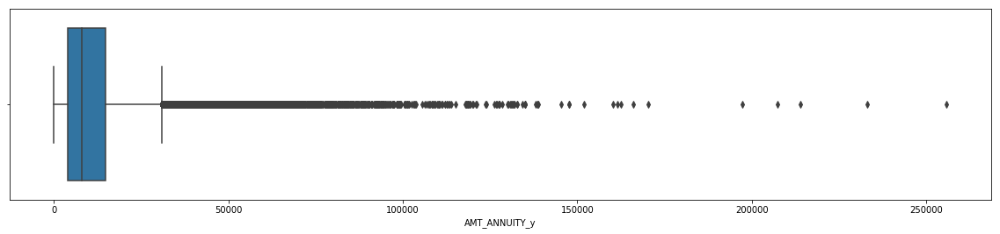

In [238]:
#plotting the boxplot of AMT_ANNUITY_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_ANNUITY_y)

In [239]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_ANNUITY_y = 14663.396250 - 3850.492500
Lower_Limit_AMT_ANNUITY_y = 3850.492500 - (1.5*IQR_AMT_ANNUITY_y)
Upper_Limit_AMT_ANNUITY_y = 14663.396250 + (1.5*IQR_AMT_ANNUITY_y)
print(IQR_AMT_ANNUITY_y)
print(Lower_Limit_AMT_ANNUITY_y)
print(Upper_Limit_AMT_ANNUITY_y)

10812.90375
-12368.863125
30882.751875


In [240]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 30882.751875 

### dropping the records from AMT_ANNUITY_y column
all_application_1 = all_application[ all_application['AMT_ANNUITY_y'] >= 30882.751875 ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(all_application_1, inplace = True)

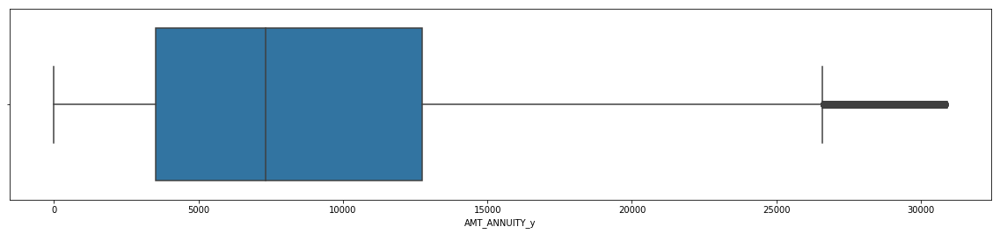

In [241]:
#plotting the boxplot of AMT_ANNUITY_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_ANNUITY_y)

#### inspecting AMT_APPLICATION column

In [242]:
all_application.AMT_APPLICATION.describe()

count    1.562100e+05
mean     9.756452e+04
std      1.177609e+05
min      0.000000e+00
25%      2.744966e+04
50%      6.340950e+04
75%      1.267774e+05
max      2.874087e+06
Name: AMT_APPLICATION, dtype: float64

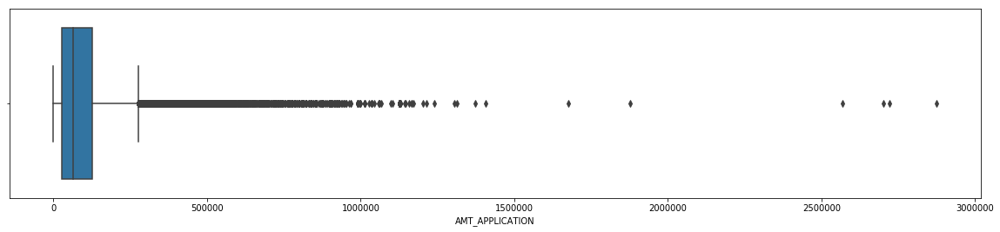

In [243]:
#plotting the boxplot of AMT_APPLICATION variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_APPLICATION)

In [244]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_APPLICATION = 1.267774e+05 - 2.744966e+04
Lower_Limit_AMT_APPLICATION = 2.744966e+04 - (1.5*IQR_AMT_APPLICATION)
Upper_Limit_AMT_APPLICATION = 1.267774e+05 + (1.5*IQR_AMT_APPLICATION)
print(IQR_AMT_APPLICATION)
print(Lower_Limit_AMT_APPLICATION)
print(Upper_Limit_AMT_APPLICATION)

99327.73999999999
-121541.94999999998
275769.01


In [245]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 30882.751875 

### dropping the records from AMT_APPLICATION column
all_application_2 = all_application[ all_application['AMT_APPLICATION'] >= 275769.01 ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(all_application_2, inplace = True)

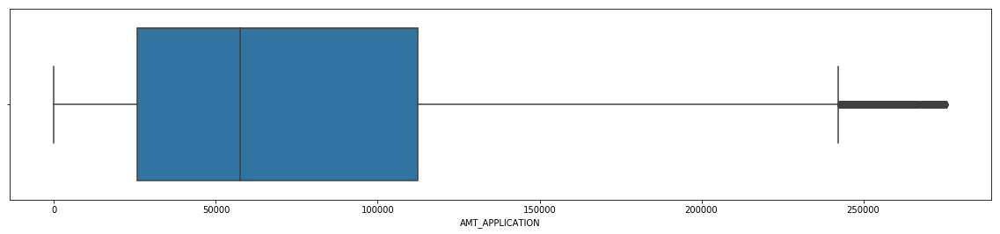

In [246]:
#plotting the boxplot of AMT_APPLICATION variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_APPLICATION)

#### inspecting AMT_CREDIT_y column

In [247]:
all_application.AMT_CREDIT_y.describe()

count    146523.000000
mean      83596.179221
std       78747.868914
min           0.000000
25%       28172.250000
50%       61650.000000
75%      119925.000000
max      900000.000000
Name: AMT_CREDIT_y, dtype: float64

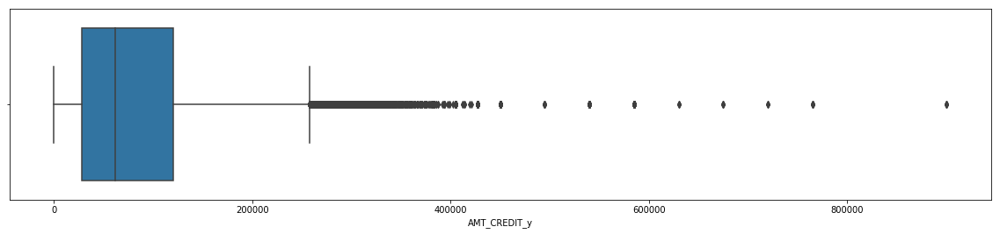

In [248]:
#plotting the boxplot of AMT_CREDIT_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_CREDIT_y)

In [249]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_CREDIT_y = 119925.000000 - 28172.250000
Lower_Limit_AMT_CREDIT_y = 28172.250000 - (1.5*IQR_AMT_CREDIT_y)
Upper_Limit_AMT_CREDIT_y = 119925.000000 + (1.5*IQR_AMT_CREDIT_y)
print(IQR_AMT_CREDIT_y)
print(Lower_Limit_AMT_CREDIT_y)
print(Upper_Limit_AMT_CREDIT_y)

91752.75
-109456.875
257554.125


In [250]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 30882.751875 

### dropping the records from AMT_CREDIT_y column
all_application_3 = all_application[ all_application['AMT_CREDIT_y'] >= 257554.125 ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(all_application_3, inplace = True)

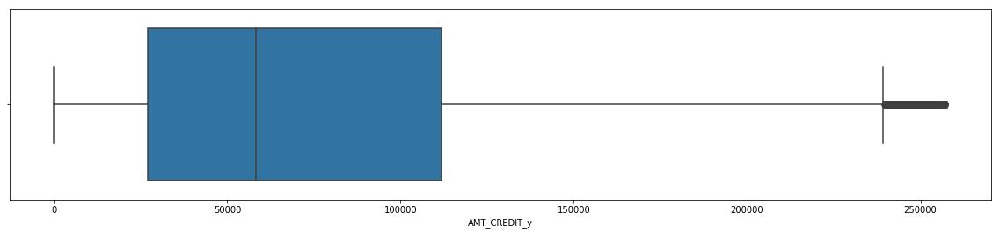

In [251]:
#plotting the boxplot of AMT_CREDIT_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_CREDIT_y)

#### inspecting AMT_GOODS_PRICE_y column

In [252]:
all_application.AMT_GOODS_PRICE_y.describe()

count    141038.000000
mean      70141.817746
std       59365.235855
min           0.000000
25%       25735.500000
50%       56058.750000
75%      106155.000000
max      585000.000000
Name: AMT_GOODS_PRICE_y, dtype: float64

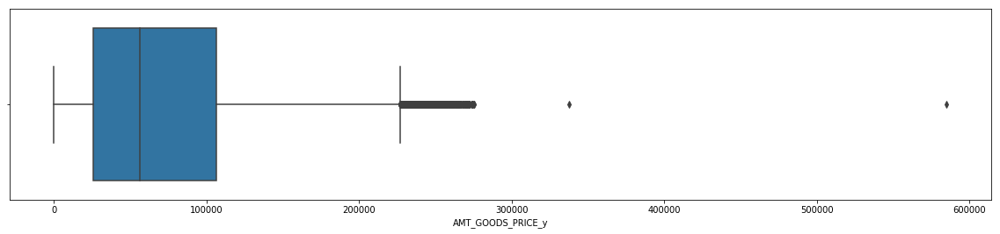

In [253]:
#plotting the boxplot of AMT_GOODS_PRICE_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_GOODS_PRICE_y)

In [254]:
## we know IQR = Q3 -Q1
## Upper Limit = Q3 + 1.5*IQR
## Lower Limit = Q1 - 1.5*IQR
#### the upper and lower limits of this boxplot is 
IQR_AMT_GOODS_PRICE_y = 106155.000000 - 25735.500000
Lower_Limit_AMT_GOODS_PRICE_y = 25735.500000 - (1.5*IQR_AMT_GOODS_PRICE_y)
Upper_Limit_AMT_GOODS_PRICE_y = 106155.000000 + (1.5*IQR_AMT_GOODS_PRICE_y)
print(IQR_AMT_GOODS_PRICE_y)
print(Lower_Limit_AMT_GOODS_PRICE_y)
print(Upper_Limit_AMT_GOODS_PRICE_y)

80419.5
-94893.75
226784.25


In [255]:
### as there are a lot of values that extend beyond the IQR deleting the records that are above  the upper limit of 226784.25 

### dropping the records from AMT_GOODS_PRICE_y column
all_application_4 = all_application[ all_application['AMT_GOODS_PRICE_y'] >= 226784.25 ].index 
  
# drop these row indexes from dataFrame 
all_application.drop(all_application_4, inplace = True)

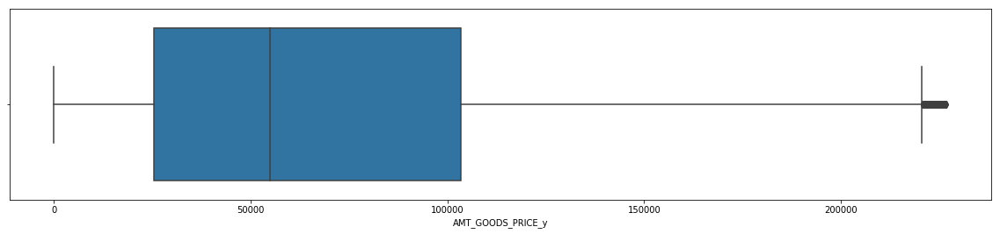

In [256]:
#plotting the boxplot of AMT_GOODS_PRICE_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.AMT_GOODS_PRICE_y)

#### inspecting YEARS_DECISION column

In [257]:
all_application.YEARS_DECISION.describe()

count    139508.000000
mean          2.709524
std           2.258441
min           0.010000
25%           0.860000
50%           1.880000
75%           4.280000
max           8.010000
Name: YEARS_DECISION, dtype: float64

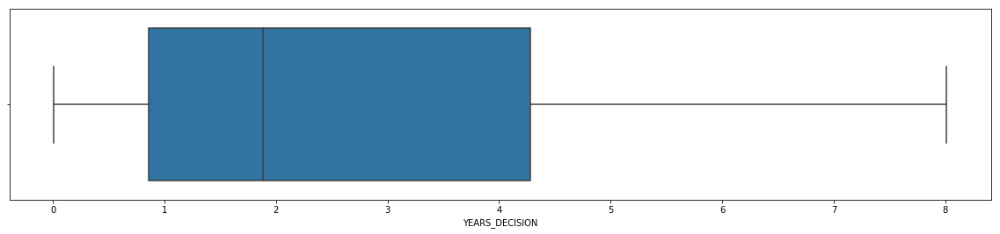

In [258]:
#plotting the boxplot of AMT_GOODS_PRICE_y variable.
plt.figure(figsize = [20,4])
sns.boxplot(all_application.YEARS_DECISION)

### `with this we have finished the data cleaning part for the merged  dataset called all_application dataset.`

In [259]:
all_application.shape

(139508, 110)

<font size=5px color=blue>Checking For Data Imbalance </font>

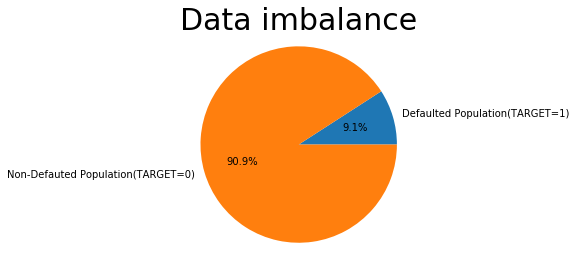

In [260]:
Defaulted = 0 
NonDefaulted = 0
for i in all_application['TARGET'].values:
    if i == 1:
        Defaulted += 1
    else:
        NonDefaulted += 1
        
Defaulted = (Defaulted/len(application['TARGET']))*100
NonDefaulted = (NonDefaulted/len(application['TARGET']))*100

x = ['Defaulted Population(TARGET=1)','Non-Defauted Population(TARGET=0)']
y = [Defaulted, NonDefaulted]


fig1, ax1 = plt.subplots()
ax1.pie(y, labels=x ,autopct='%1.1f%%')
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Data imbalance',fontsize=30)
plt.show()

### Lets separate the total dataset into two parts to perform categorical Univariate analysis on both.
- Non-defaulted Population(Target=0)
- Defaulted Population(Target=1)

In [261]:
all_application_0 =all_application[all_application.TARGET==0]
all_application_0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,YEARS_DECISION
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.18,0.62,11.67,6.93,100000-250000,100000-250000,50000-100000,0-10000,50 to 60 years,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5,Y,1,Approved,-815,Cash through the bank,New,Mobile,POS,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0,2.23
3,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.61,8.32,11.81,9.47,500000-750000,500000-750000,100000-150000,20000-30000,50 to 60 years,2001242,Cash loans,16509.600,180000.0,180000.0,180000.0,SUNDAY,14,Y,1,Approved,-865,Cash through the bank,Repeater,NaN,Cash,Regional / Local,1200,Consumer electronics,18.0,high,Cash Street: high,365243.0,-834.0,-324.0,-354.0,-347.0,0.0,2.37
4,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,46.41,4.35,13.62,1.31,250000-500000,250000-500000,50000-100000,20000-30000,40 to 50 years,2218188,Consumer loans,17885.835,162598.5,162598.5,162598.5,THURSDAY,10,Y,1,Approved,-370,Cash through the bank,Repeater,Consumer Electronics,POS,Country-wide,110,Consumer elec

In [262]:
all_application_0.shape

(126786, 110)

In [263]:
all_application_1 =all_application[all_application.TARGET==1]
all_application_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMP_YEARS,RESIGN_YEARS,YEARS_ID_PUBLISH,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_ANNUITY_RANGE,AGE_YEARS_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,YEARS_DECISION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.92,1.75,9.99,5.81,250000-500000,250000-500000,200000-250000,20000-30000,20 to 30 years,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,Approved,-606,NaN,New,Vehicles,POS,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0,1.66
24,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,238500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.007305,-13384,-3597,-45.0,-4409,1,1,1,1,1,0,Sales staff,2.0,3,3,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.674203,1.0,0.0,1.0,0.0,-1480.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,36.67,9.85,0.12,12.08,250000-500000,100000-250000,100000-150000,10000-20000,30 to 40 years,1514918,Consumer loans,5791.725,33250.5,41251.5,33250.5,MONDAY,11,Y,1,Approved,-1480,Cash through the bank,Repeater,Mobile,POS,Country-wide,30,Connectivity,10.0,high,POS mobile with interest,365243.0,-1450.0,-1180.0,-1180.0,-1172.0,1.0,4.05
57,100130,1,Cash loans,F,N,Y,1,157500.0,723996.0,30802.5,585000.0,Unaccompanied,Commercial associate,Incomplete higher,Separated,House / apartment,0.007274,-10526,-267,-387.0,-3190,1,1,0,1,1,0,Sales staff,2.0,2,2,SUNDAY,12,0,1,1,0,1,1,Trade: type 2,0.282069,0.0,0.0,0.0,0.0,-56.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,28.84,0.73,1.06,8.74,500000-750000,500000-750000,150000-200000,30000-40000,20 to 30 years,1932718,Consumer loans,11245.950,99013.5,99013.5,99013.5,SUNDAY,19,Y,1,Approved,-56,Cash through the bank,Repeater,Mobile,POS,Country-wide,27,Connectivity,10.0,low_normal,POS mobil

In [264]:
all_application_1.shape

(12722, 110)

## Univariate Analysis

### 1. Categorical columns

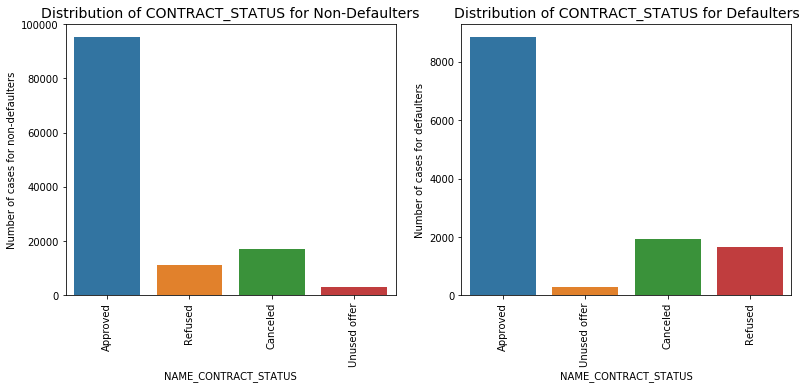

In [265]:
# Contract status and their count

plt.figure(figsize=(13,5))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.NAME_CONTRACT_STATUS)
plt.title('Distribution of CONTRACT_STATUS for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.NAME_CONTRACT_STATUS)
plt.title('Distribution of CONTRACT_STATUS for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()


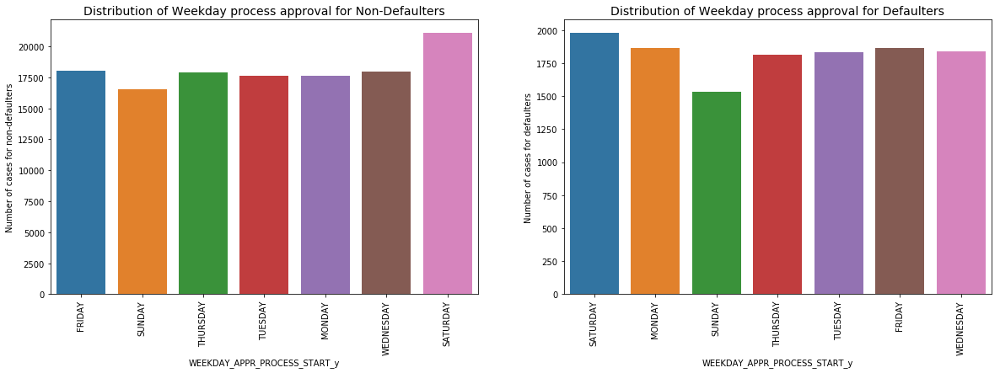

In [266]:
# Weekday previous application approvals and their count

plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.WEEKDAY_APPR_PROCESS_START_y)
plt.title('Distribution of Weekday process approval for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.WEEKDAY_APPR_PROCESS_START_y)
plt.title('Distribution of Weekday process approval for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

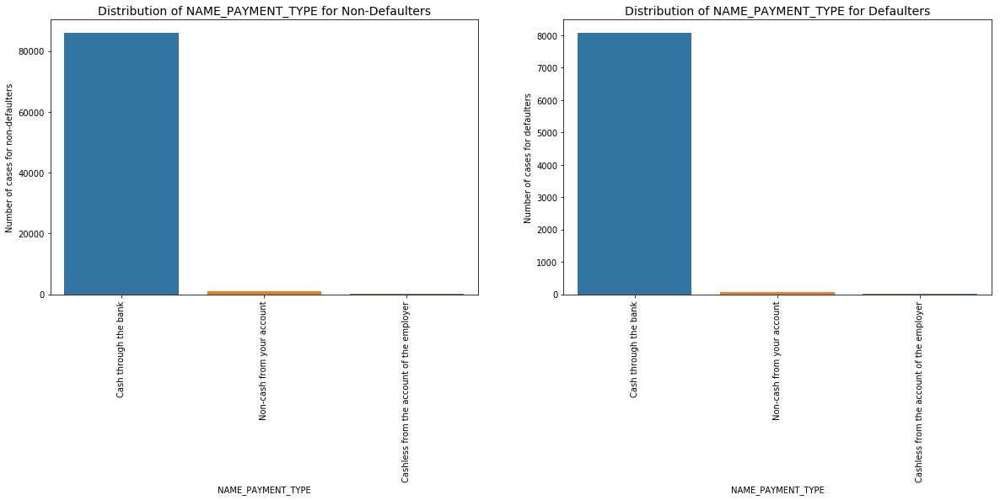

In [267]:
# Payment method and their count

plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.NAME_PAYMENT_TYPE)
plt.title('Distribution of NAME_PAYMENT_TYPE for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.NAME_PAYMENT_TYPE)
plt.title('Distribution of NAME_PAYMENT_TYPE for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

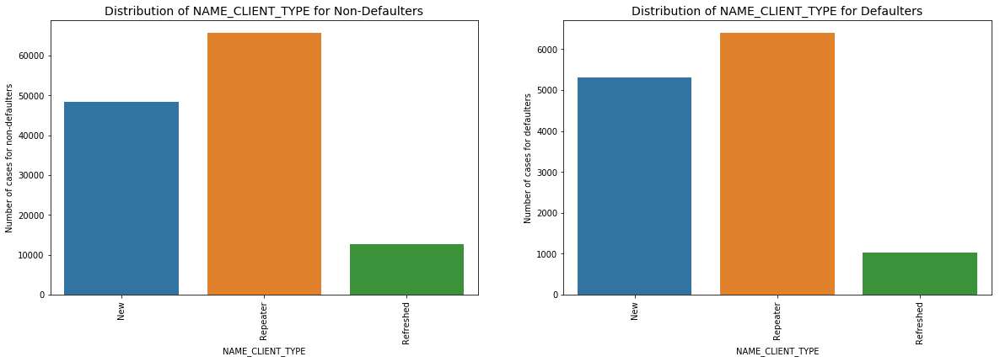

In [268]:
### Distribution of Client typpes and their count
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.NAME_CLIENT_TYPE)
plt.title('Distribution of NAME_CLIENT_TYPE for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.NAME_CLIENT_TYPE)
plt.title('Distribution of NAME_CLIENT_TYPE for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: New clients tends to default more.


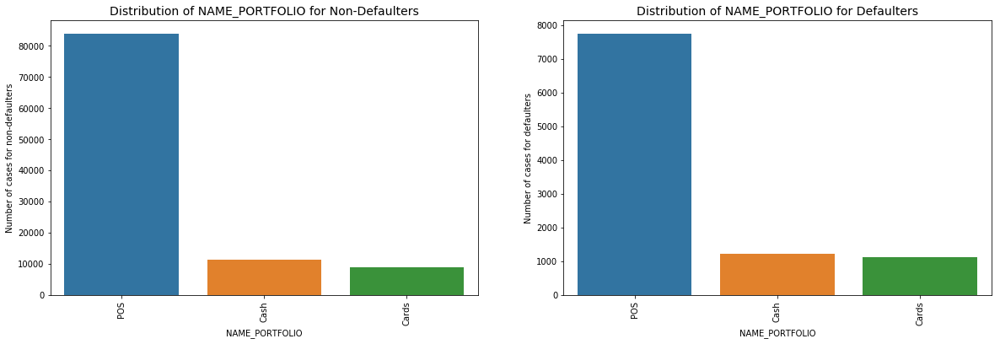

In [269]:
### Distribution of Portfolio and their count
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.NAME_PORTFOLIO)
plt.title('Distribution of NAME_PORTFOLIO for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.NAME_PORTFOLIO)
plt.title('Distribution of NAME_PORTFOLIO for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People pay via POS the most.


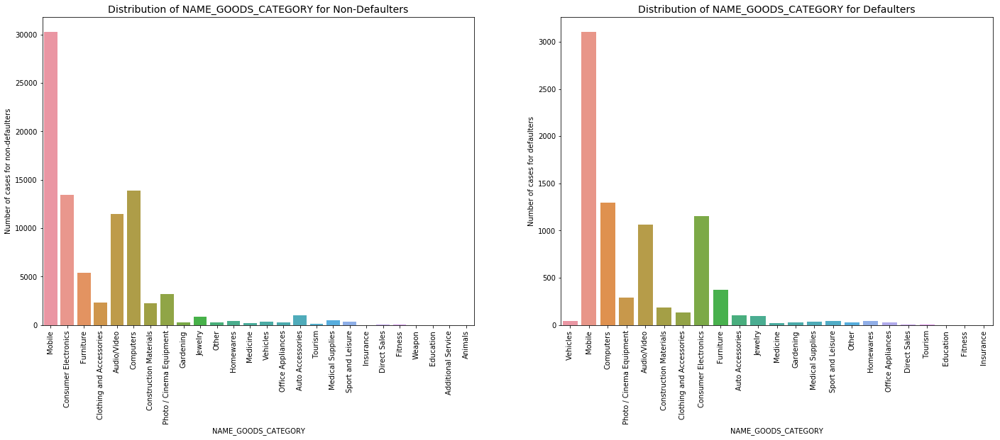

In [270]:
### Distribution of Goods Category and their count
plt.figure(figsize=(24,8))
plt.subplot(1, 2, 1)
sns.countplot(all_application_0.NAME_GOODS_CATEGORY)
plt.title('Distribution of NAME_GOODS_CATEGORY for Non-Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1, 2, 2)
sns.countplot(all_application_1.NAME_GOODS_CATEGORY)
plt.title('Distribution of NAME_GOODS_CATEGORY for Defaulters', fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People generally take loans to purchase goods such as mobiles, computers and consumer electronics.


### 2. Numerical columns

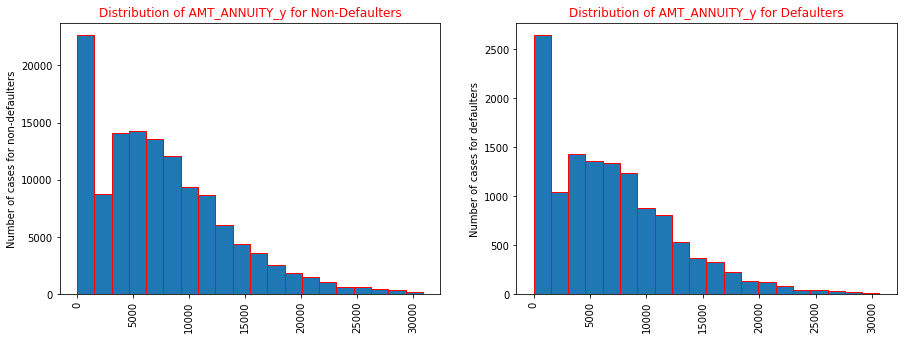

In [271]:
### Distribution of previous Amt. Annuity and their count
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(all_application_0["AMT_ANNUITY_y"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_ANNUITY_y for Non-Defaulters", fontsize = 12,color="r")
plt.ylabel('Number of cases for non-defaulters')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.hist(all_application_1["AMT_ANNUITY_y"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_ANNUITY_y for Defaulters", fontsize = 12,color="r")
plt.ylabel('Number of cases for defaulters')
plt.xticks(rotation=90)
plt.show()

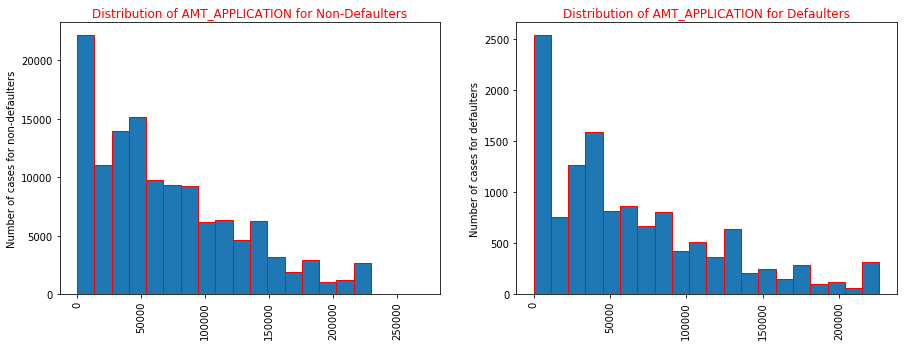

In [272]:
### Distribution of previous Amt. Application and their count
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(all_application_0["AMT_APPLICATION"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_APPLICATION for Non-Defaulters", fontsize = 12,color="r")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(all_application_1["AMT_APPLICATION"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_APPLICATION for Defaulters", fontsize = 12,color="r")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Inference: People who applies for 50thousand to 1.5lakh tend to default less.


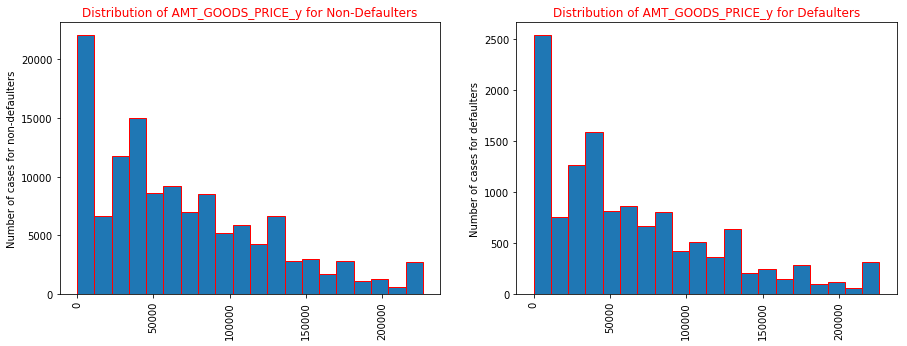

In [273]:
### Distribution of previous Amt. Goods Price and their count
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(all_application_0["AMT_GOODS_PRICE_y"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_GOODS_PRICE_y for Non-Defaulters", fontsize = 12,color="r")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for non-defaulters')
plt.subplot(1,2,2)
plt.hist(all_application_1["AMT_GOODS_PRICE_y"],bins = 20,edgecolor='#FF0000')
plt.title("Distribution of AMT_GOODS_PRICE_y for Defaulters", fontsize = 12,color="r")
plt.xticks(rotation=90)
plt.ylabel('Number of cases for defaulters')
plt.show()

## Bivariate Analysis

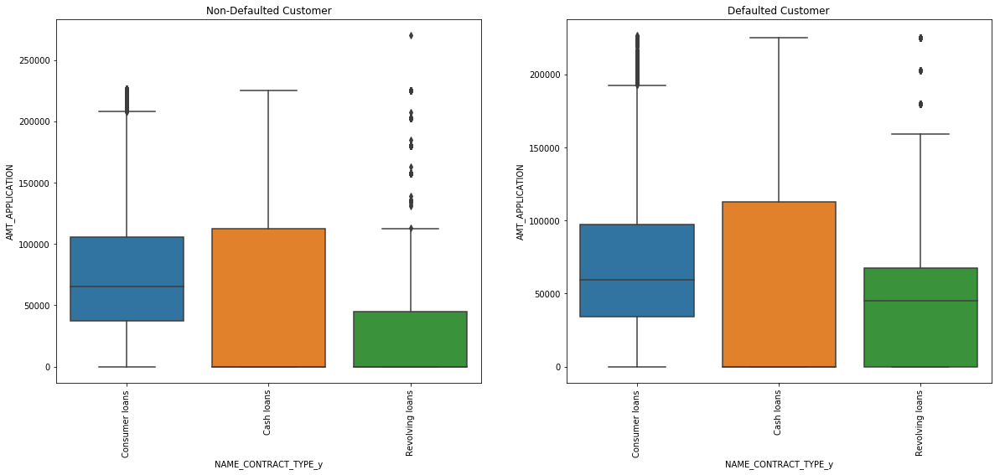

In [274]:
#Contract Type vs Amt. Application
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=all_application_0,y='AMT_APPLICATION',x='NAME_CONTRACT_TYPE_y')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=all_application_1,y='AMT_APPLICATION',x='NAME_CONTRACT_TYPE_y')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

## Inference: People with revolving loans and applied for amount more than 50000 tend to default more.


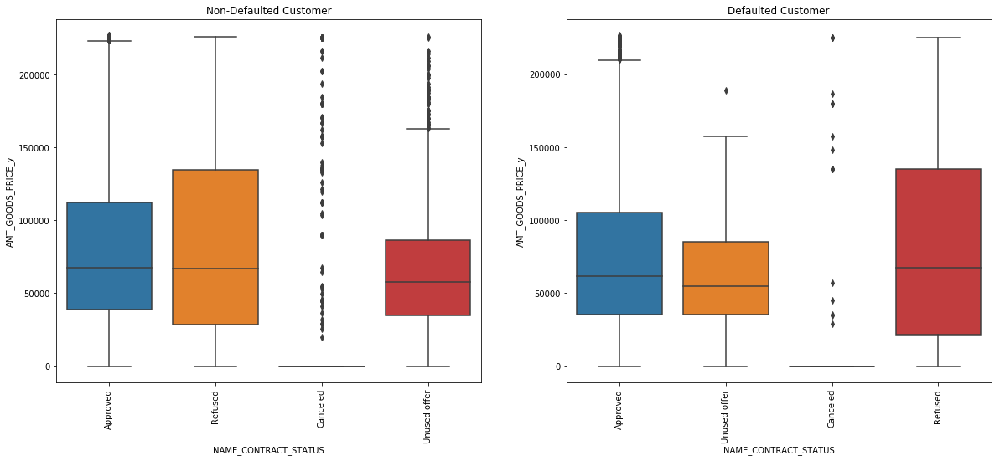

In [275]:
#Contract Status vs Amt. Goods Price
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=all_application_0,y='AMT_GOODS_PRICE_y',x='NAME_CONTRACT_STATUS')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=all_application_1,y='AMT_GOODS_PRICE_y',x='NAME_CONTRACT_STATUS')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

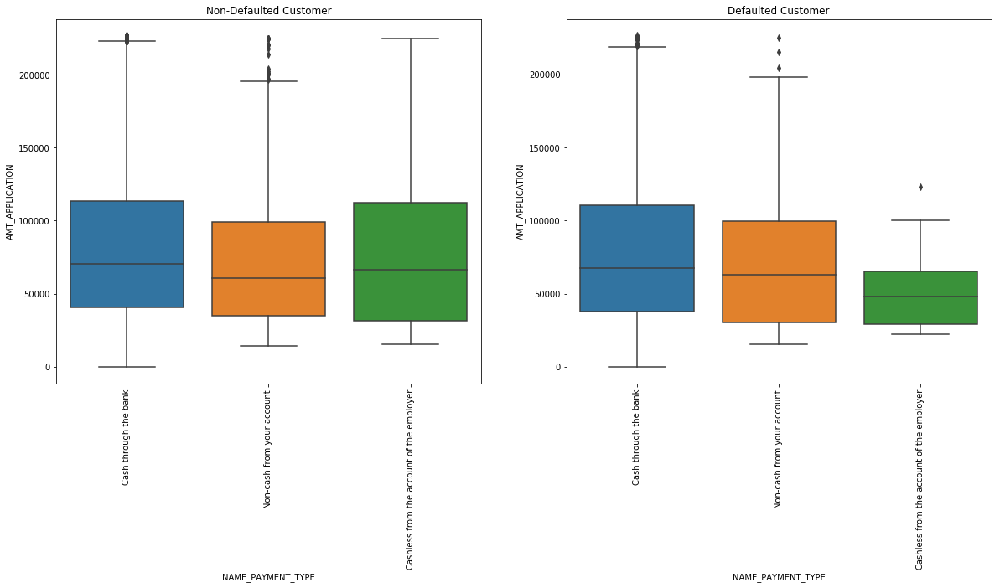

In [276]:
#Payment Type vs Amt. Application
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=all_application_0,y='AMT_APPLICATION',x='NAME_PAYMENT_TYPE')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=all_application_1,y='AMT_APPLICATION',x='NAME_PAYMENT_TYPE')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

## Inference: People pay with payment type cashless from the account of the employer tends to default less.


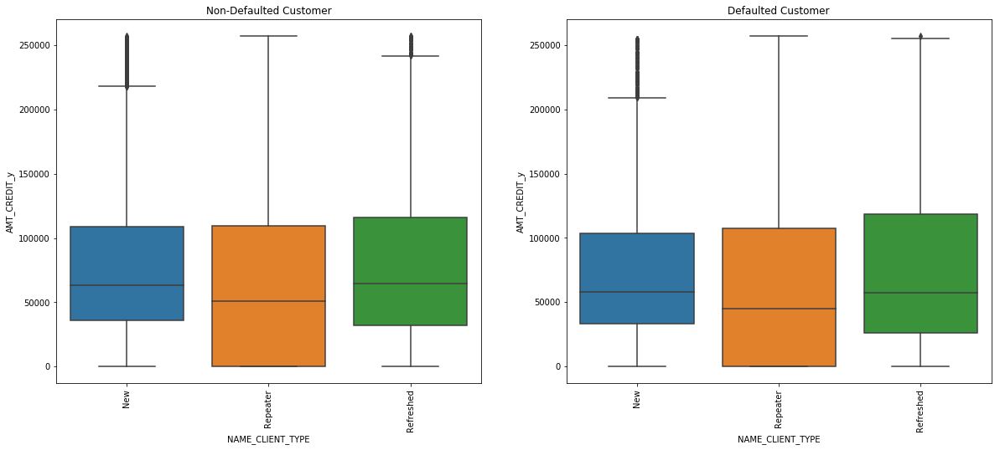

In [277]:
#Client Type vs Amt. Credit
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=all_application_0,y='AMT_CREDIT_y',x='NAME_CLIENT_TYPE')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=all_application_1,y='AMT_CREDIT_y',x='NAME_CLIENT_TYPE')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

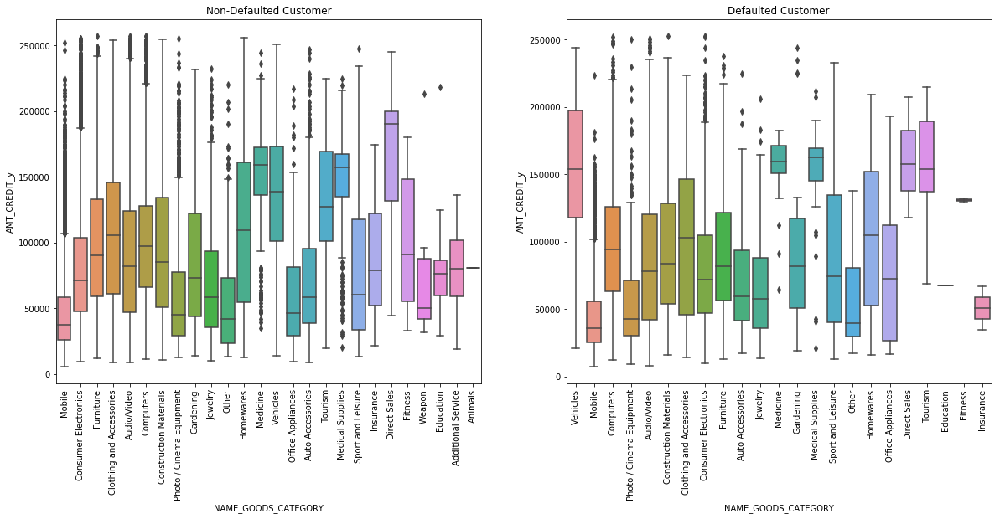

In [278]:
#Goods Category vs Amt. Credit
plt.figure(figsize=(20,8)) 

plt.subplot(1,2,1)
ax = sns.boxplot(data=all_application_0,y='AMT_CREDIT_y',x='NAME_GOODS_CATEGORY')
plt.title('Non-Defaulted Customer')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
ax = sns.boxplot(data=all_application_1,y='AMT_CREDIT_y',x='NAME_GOODS_CATEGORY')
plt.title('Defaulted Customer')
plt.xticks(rotation=90)
plt.show()

## Inference: People with goods category such as Education,fitness and Insurance tends to default less.


## Multivariate Analysis

In [279]:
resA = pd.pivot_table(data = all_application_0, index = "NAME_GOODS_CATEGORY",columns="PRODUCT_COMBINATION",values = "AMT_CREDIT_y",aggfunc=np.mean)
resA

PRODUCT_COMBINATION,Card Street,POS household with interest,POS household without interest,POS industry with interest,POS industry without interest,POS mobile with interest,POS mobile without interest,POS other with interest,POS others without interest
NAME_GOODS_CATEGORY,,,,,,,,,
Additional Service,NaN,87459.000000,NaN,59752.500000,80599.500000,NaN,NaN,NaN,NaN
Animals,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81000.000000,NaN
Audio/Video,45000.0,86775.171489,106990.633048,66653.760000,40583.250000,54879.507478,58897.565217,85156.312500,39783.000000
Auto Accessories,NaN,65391.261120,76009.500000,62164.469388,29808.000000,39337.578947,19401.428571,77962.341248,77017.500000
Clothing and Accessories,NaN,56547.529412,NaN,106969.736609,98841.620000,76936.500000,NaN,142674.300000,NaN
Computers,103500.0,100120.799918,118442.101058,82210.500000,47036.250000,75017.892826,79565.819277,82085.092105,127702.285714
Construction Materials,NaN,79668.478723,83132.357143,97005.971393,99580.963235,84501.818182,15894.000000,115885.847368,192268.500000
Consumer Electronics,62800.0,77629.351872,88423.112403,67528.558537,64340.357143,74096.700000,94526.100000,87927.053097,105980.884615
Direct Sales,NaN,NaN,NaN,206066.700000,179444.250000,NaN,NaN,146249.500000,197244.000000


In [280]:
resB = pd.pivot_table(data = all_application_1, index = "NAME_GOODS_CATEGORY",columns="PRODUCT_COMBINATION",values = "AMT_CREDIT_y",aggfunc=np.mean)
resB

PRODUCT_COMBINATION,Card Street,POS household with interest,POS household without interest,POS industry with interest,POS industry without interest,POS mobile with interest,POS mobile without interest,POS other with interest,POS others without interest
NAME_GOODS_CATEGORY,,,,,,,,,
Audio/Video,54000.0,85290.949810,104233.942308,96812.100000,15772.500000,53061.328125,48040.500000,95984.550000,66114.00000
Auto Accessories,NaN,63267.187500,NaN,106057.125000,NaN,41870.209091,NaN,75696.157895,NaN
Clothing and Accessories,NaN,30093.750000,NaN,102541.423729,90054.900000,NaN,NaN,86481.000000,NaN
Computers,NaN,99732.529302,118140.006608,120639.375000,NaN,72334.133368,81588.477273,107075.250000,NaN
Construction Materials,NaN,85336.977273,86536.500000,96653.346429,102031.500000,65452.500000,NaN,98109.000000,NaN
Consumer Electronics,69000.0,77410.856512,90801.533597,103703.558824,55055.250000,57459.000000,26275.500000,58144.000000,81627.00000
Direct Sales,NaN,NaN,NaN,157495.500000,NaN,NaN,NaN,118057.500000,207711.00000
Education,NaN,NaN,NaN,67500.000000,NaN,NaN,NaN,NaN,NaN
Fitness,NaN,NaN,NaN,130911.750000,NaN,NaN,NaN,NaN,NaN


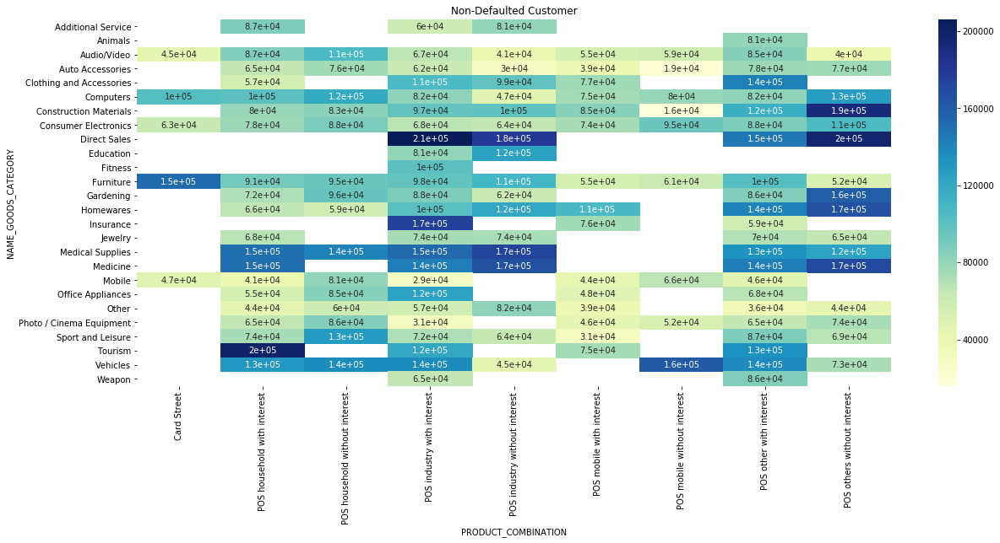

In [281]:
plt.figure(figsize=(20,8)) 
plt.title("Non-Defaulted Customer")
sns.heatmap(resA,cmap = "YlGnBu",annot = True)

## Inference: People with goods category Direct sales and Product combination POS industry with interest  tends to default less.
## Inference2: people with Goods category Tourism and Product combination POS Household with interest tends to default less.


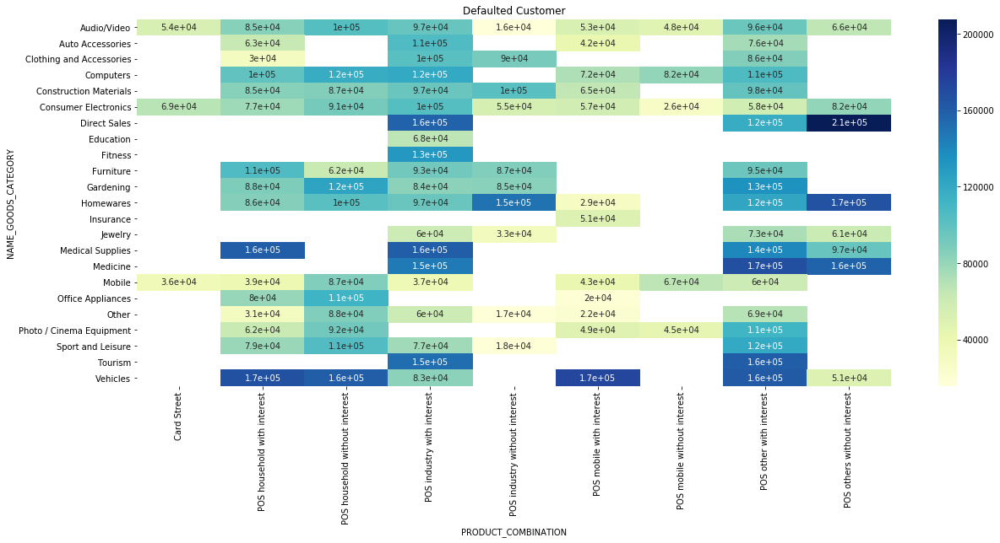

In [282]:
plt.figure(figsize=(20,8)) 
plt.title("Defaulted Customer")
sns.heatmap(resB,cmap = "YlGnBu",annot = True)

In [283]:
#selecting columns for correlation

colsA=[ 'AMT_ANNUITY_y',
       'AMT_APPLICATION', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y',
        'CNT_PAYMENT']

In [284]:
Non_defaulters=all_application_0[colsA]
Non_defaulters_correlation = Non_defaulters.corr()
round(Non_defaulters_correlation, 3)

,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_y,1.000,0.772,0.756,0.772,0.343
AMT_APPLICATION,0.772,1.000,0.903,1.000,0.555
AMT_CREDIT_y,0.756,0.903,1.000,0.903,0.518
AMT_GOODS_PRICE_y,0.772,1.000,0.903,1.000,0.555
CNT_PAYMENT,0.343,0.555,0.518,0.555,1.000


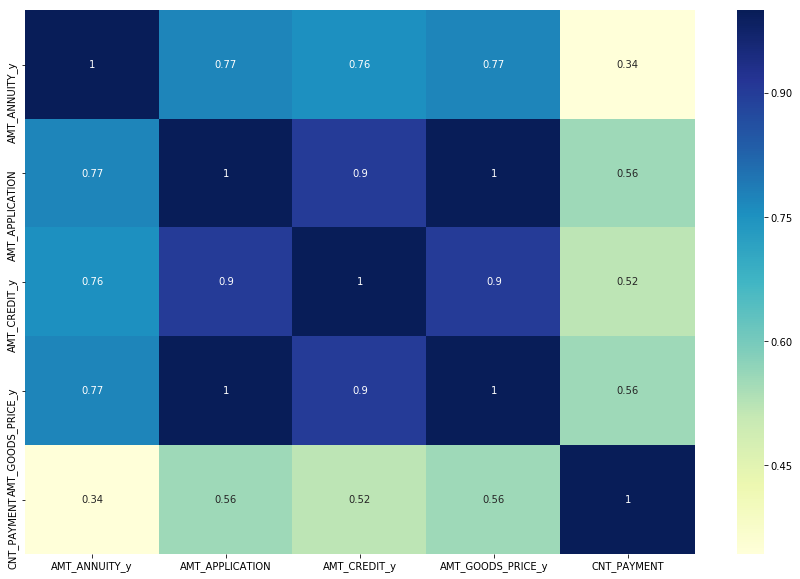

In [285]:
# figure size
plt.figure(figsize=(15,10))

# heatmap
sns.heatmap(Non_defaulters_correlation, cmap="YlGnBu", annot=True)
plt.show()

In [286]:
defaulters=all_application_1[colsA]
defaulters_correlation = defaulters.corr()
round(defaulters_correlation, 3)

,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_y,1.000,0.773,0.770,0.773,0.415
AMT_APPLICATION,0.773,1.000,0.913,1.000,0.558
AMT_CREDIT_y,0.770,0.913,1.000,0.913,0.530
AMT_GOODS_PRICE_y,0.773,1.000,0.913,1.000,0.558
CNT_PAYMENT,0.415,0.558,0.530,0.558,1.000


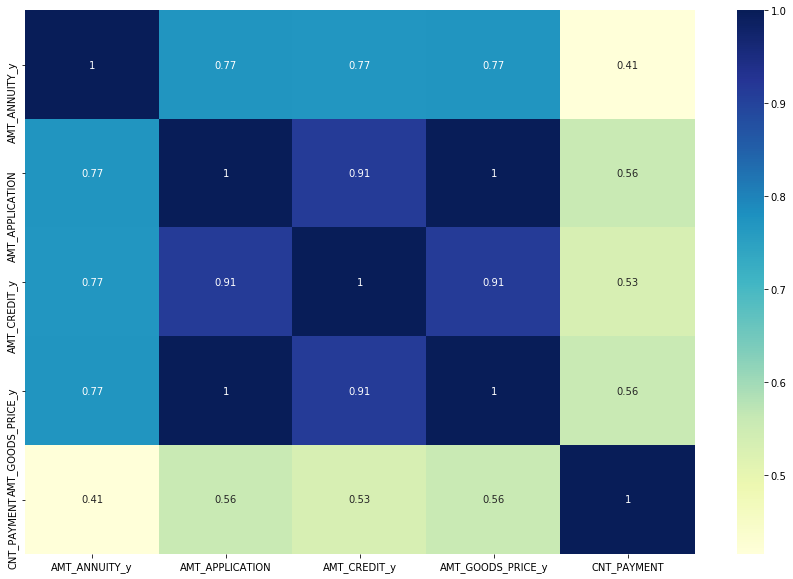

In [287]:
# figure size
plt.figure(figsize=(15,10))

# heatmap
sns.heatmap(defaulters_correlation, cmap="YlGnBu", annot=True)
plt.show()

## There are very high correlation between 
### 1. AMT_APPLICATION VS AMT_GOODS_PRICE
### 2. AMT_APPLICATION VS AMT_CREDIT
### 3. AMT_CREDIT VS AMT_GOODS_PRICE

<font size=7px color=red> Conclusion :</font>

<font size=6px color=blue>Inferences from Application Data set:</font>

### 1.Core-staffs , Sales-staff ,Accountants, High skilled tech staff and Managers tend to default less.
### 2.People having Academic degree are Non-defaulters.
### 3.People having less years of employment experience tend to default more.

<font size=6px color=blue>Inferences from Final merged All Application Data set:</font>

### 1.The count of ‘Refused’ in ‘NAME_CONTRACT_STATUS’ is comparatively less and it also has maximum % of payment difficulties- around 13%. Hence, client with contract status as ‘Refused’ in previous application are the driving factors for Loan Defaulters.
### 2.The count of ‘Revolving Loans’ in ‘NAME_CONTRACT_TYPE’ is comparatively very less and it also has maximum % of payment difficulties- around 12%. Hence, client with contract type as ‘Revolving loans’ in previous application are the driving factors for Loan Defaulters.
### 3.It can be observed from the graph that Clients with 'Revolving loans' and with 'Refused' previous application tend to have more % of payment difficulties in current application. Since the count of both 'Revolving loans' and ‘Refused’ is comparatively less(from the graphs in previous slide), clients with ‘Revolving Loans’ and ‘Refused’ previous application are driving factors for Loan Defaulters
